# ERP analysis using MNE and Toeplitzlda for auditory word stimuli


This notebook is based on anonymous patient data, stored on an external SSD.


#### Import Libraries

In [ ]:
import mne
import re
from pathlib import Path
from matplotlib import pyplot as plt
import seaborn as sns
import os
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import numpy as np
import pandas as pd
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from toeplitzlda.classification import ToeplitzLDA
from mne.preprocessing import ICA
from collections import defaultdict
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
import glob
from scipy.stats import wilcoxon
        
warnings.simplefilter(action='ignore', category=RuntimeWarning)

sns.set_style('whitegrid')
mne.set_log_level('WARNING')

np.random.seed(42)

### Download and setup data

In [96]:
# Helper functions
def load_and_preprocess_raw(header_file, s_freq=100, filter_band=(0.5, 40)):
    non_eeg_channels = ["EOGvu", "x_EMGl", "x_GSR", "x_Respi", "x_Pulse", "x_Optic"]
    raw = mne.io.read_raw_brainvision(header_file, misc=non_eeg_channels, preload=True)
    raw.set_montage("standard_1020")
    raw.filter(*filter_band, method="iir")
    raw.resample(sfreq=s_freq)  
    raw.set_channel_types({
    "EOGvu": "eog",         # Vertical EOG (eyeblinks)
    "x_Pulse": "ecg",       # Pulse/heartbeat
    "x_EMGl": "emg",        # Muscle 
    })
    raw.pick_types(eeg=True, eog=False, ecg=False, emg=False, misc=False) # You can try to include non-eeg channels, 
    #in that case they should be set to True

    return raw 


def epoch_raw(raw, decimate=1):    # decimate=10 downsamples to 100Hz,
    target_ids = list(range(111, 117))
    non_target_ids = list(range(101, 107))
    event_id = {f"Word_{i-110}/Target": i for i in target_ids}
    event_id.update({f"Word_{i-100}/NonTarget": i for i in non_target_ids})
    evs, _ = mne.events_from_annotations(raw)

    epochs = mne.Epochs(raw=raw,
        events=evs,
        event_id=event_id,
        proj=False,
        tmax=1,
        preload=True,
        decim=decimate)      
    return epochs   # Shape: (n_epochs, n_channels, n_times). E.g., you receive 6 epochs from 6 stimuli


def sort_key_by_block_and_run(path, pattern):
    match = pattern.search(path.name)
    if match:
        block_num = int(match.group(1))
        run_num = int(match.group(2))
        return (block_num, run_num)
    else:
        return (float("inf"), float("inf"))  
    

# function taken from assignment 6 of the BCI course
def get_jumping_means(epo, boundaries): 
    data = epo.get_data() 

    n_epochs, n_channels, _ = data.shape
    n_bins = len(boundaries) - 1
    X = np.zeros((n_epochs, n_channels, n_bins)) 

    for i in range(n_bins): 
        idx = epo.time_as_index((boundaries[i], boundaries[i+1]))  
        X[:, :, i] = data[:, :, idx[0]:idx[1]].mean(axis=2)  
    
    return X


def check_BT_assumptions(data, channel_names=['F3', 'Cz', 'O2'], t_min=0.1, t_max=0.8, h_pass=0.5, l_pass=40):
    
    def compute_temporal_covariance(channel_data):
        # channel_data: (n_epochs, n_bins)
        return np.cov(channel_data, rowvar=False)

    def plot_temporal_covariance(cov_matrix, channel):
        plt.figure(figsize=(8, 6))
        sns.heatmap(cov_matrix, cmap='viridis')
        plt.title(f"Temporal Covariance Matrix - {channel}")
        plt.xlabel("Time Index")
        plt.ylabel("Time Index")
        plt.show()

        n = cov_matrix.shape[0]
        plt.figure(figsize=(10, 6))
        for i in range(n):
            plt.plot(cov_matrix[i, i:], alpha=0.7, label=f'Row {i}' if i % 10 == 0 else "")
        plt.title(f"{channel}")
        plt.xlabel("Time Offset (in samples)")
        plt.ylabel("Covariance (in $V^2$)")
        #plt.ylim(-1e-10, 2e-10)
        n = cov_matrix.shape[0]
        plt.xticks(np.arange(0, n, 2))  
        plt.grid(True)
        plt.show()

    data.filter(h_pass, l_pass, fir_design='firwin')    # bandpass filter

    # This is wrong. It makes epochs for all labels, not just target or non-target:
    #events = mne.events_from_annotations(data)[0]
    #epochs = mne.Epochs(data, events=events, event_id=None,
                        #tmin=0.1, tmax=0.6, baseline=None, preload=True, event_repeated='drop')
                        
    # Define Target and NonTarget event IDs
    target_ids = list(range(111, 117))
    non_target_ids = list(range(101, 107))
    event_id = {f"Word_{i-110}/Target": i for i in target_ids}
    event_id.update({f"Word_{i-100}/NonTarget": i for i in non_target_ids})

    # Extract events from annotations
    events, _ = mne.events_from_annotations(data)

    # Epoch only the desired events
    epochs = mne.Epochs(data,
                        events=events,
                        event_id=event_id,
                        tmin=t_min,
                        tmax=t_max,
                        baseline=None,
                        preload=True,
                        event_repeated='drop')

    
    clf_ival_boundaries = np.linspace(t_min, t_max, 21)
    X_features = get_jumping_means(epochs, clf_ival_boundaries) #shape(epochs, channels, time_bins)


    temporal_covs = {}

    for ch in channel_names:
        idx = epochs.ch_names.index(ch)
        ch_data = X_features[:, idx, :]  # shape(n_epochs, n_bins)
        cov = compute_temporal_covariance(ch_data)
        temporal_covs[ch] = cov
        plot_temporal_covariance(cov, ch)

    return temporal_covs

def load_and_concatenate_raws(blocks):  # concatenates all runs for the specified blocks
    all_runs = []
    for block_name in sorted(blocks.keys()):
        for raw in blocks[block_name].values():
            all_runs.append(raw.copy())  # Use a copy to not modifying original
    return mne.concatenate_raws(all_runs)

# use mne's ICA.apply() to exclude components (goes back to sensor space) 
def apply_ica_and_exclude_sources(raw, ica, component_idxs):
    raw_copy = raw.copy()
    ica.apply(raw_copy, exclude=component_idxs)
    return raw_copy


In [97]:
# Config
# Define the base patient directory
base_path = Path("/Volumes/Lexar/anonymized_P1-P10/P01")
filter_band = (0.5, 40)
session_id = "P01_S"
ica_dir = "/Volumes/Lexar/ica_outputs"

In [99]:
def load_sessions(base_path, session_id, filter_band):
    sessions = sorted(base_path.glob(f"{session_id}*"))

    data = defaultdict(lambda: defaultdict(dict))

    pattern = re.compile(r"Block(\d+)_Run(\d+)", re.IGNORECASE)

    for session in sessions:
        session_name = session.name
        header_files = sorted(
            session.glob("auditoryAphasia*.vhdr"),
            key=lambda p: sort_key_by_block_and_run(p, pattern)
        )

        print(f"Loading files: {header_files}")

        for header_file in header_files:
            match = pattern.search(header_file.name)
            if not match:
                print(f"Filename does not match expected pattern: {header_file.name}")
                continue

            block_num, run_num = int(match.group(1)), int(match.group(2))
            block_name = f"block_{block_num}"
            run_name = f"run_{run_num}"

            raw = load_and_preprocess_raw(header_file, filter_band=filter_band)
            data[session_name][block_name][run_name] = raw

    return data

data = load_sessions(base_path, session_id, filter_band)


Loading files: [PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block1_Run1.vhdr'), PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block1_Run2.vhdr'), PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block1_Run3.vhdr'), PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block1_Run4.vhdr'), PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block1_Run5.vhdr'), PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block1_Run6.vhdr'), PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block2_Run1.vhdr'), PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block2_Run2.vhdr'), PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block2_Run3.vhdr'), PosixPath('/Volumes/Lexar/anonymized_P1-P10/P01/P01_S03/auditoryAphasia_6D_350_Block2_Run4.vh

#### Checking the assumptions of Block Toeplitz LDA on the given data

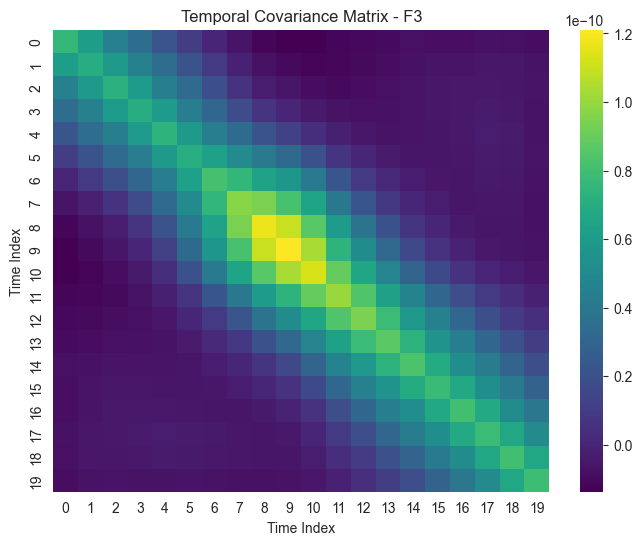

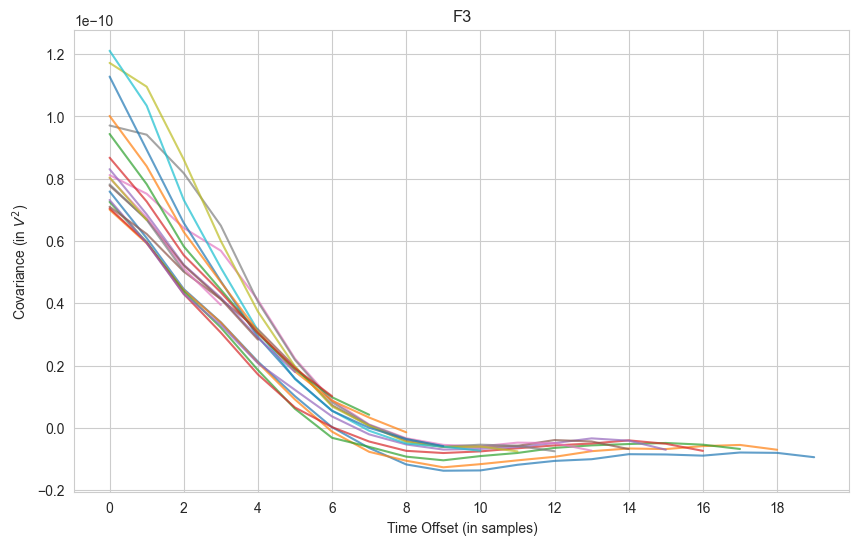

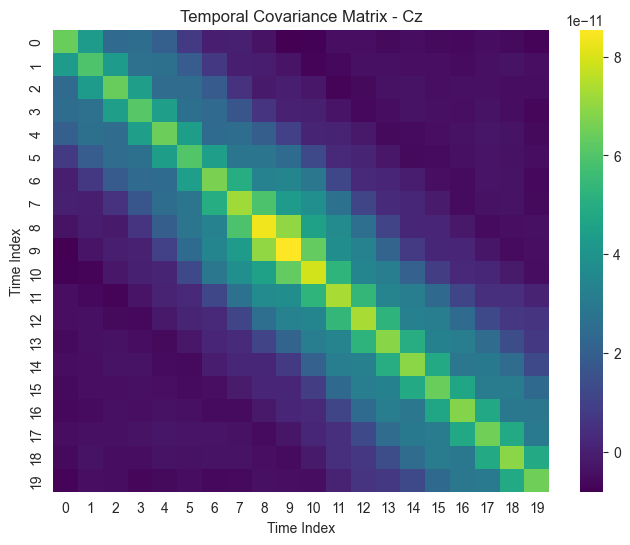

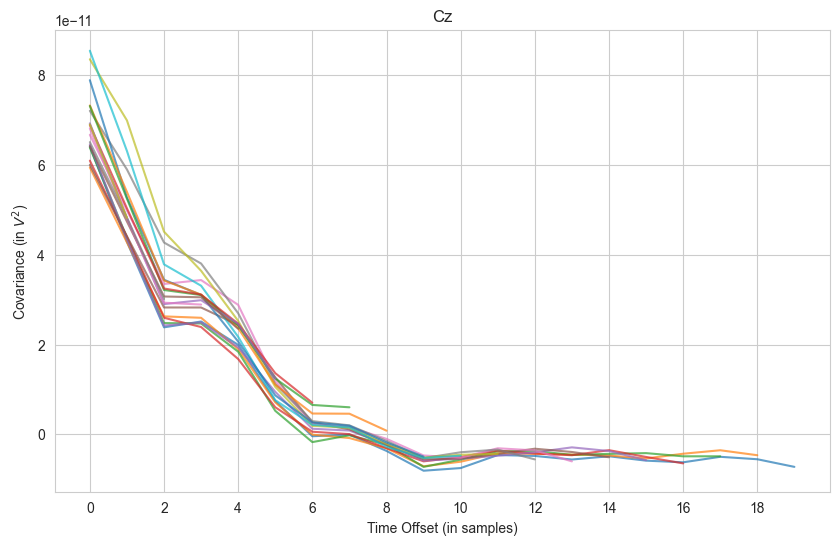

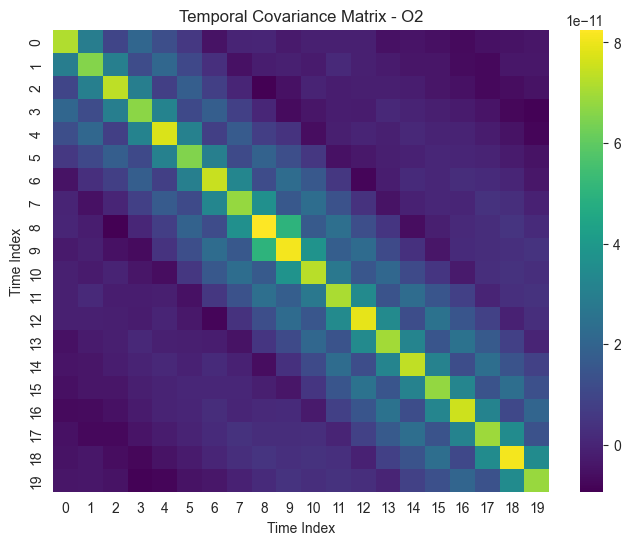

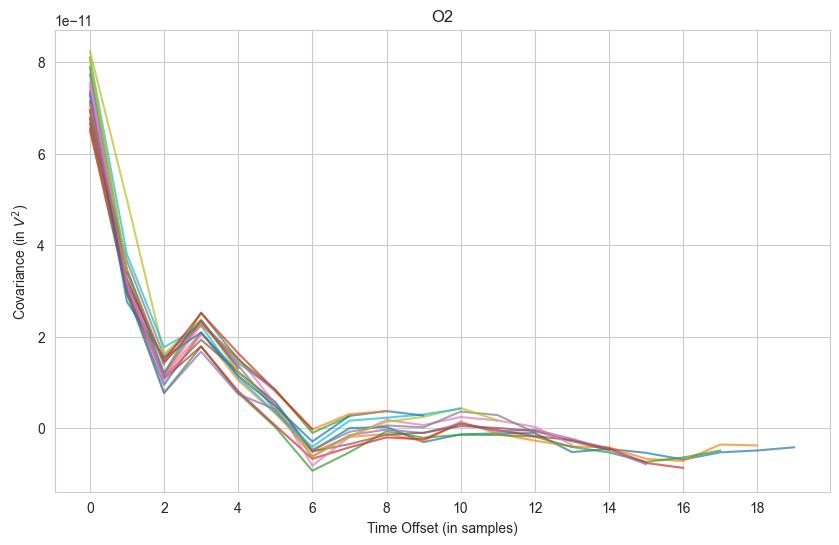

In [ ]:
session_name='P01_S08'
# Safely concatenate all runs from all blocks in the session
blocks = data[session_name]
all_runs = []

full_session = load_and_concatenate_raws(blocks)
    
check_BT_assumptions(full_session, ['F3', 'Cz', 'O2'], 0.1, 0.6)

# Clean up variables
del blocks, all_runs, full_session


#### Fitting ICA per session

Saving ICA components to: /Volumes/Lexar/ica_outputs

Processing session: P1_S03
 - Block 'block_1' duration: 1797.54 seconds


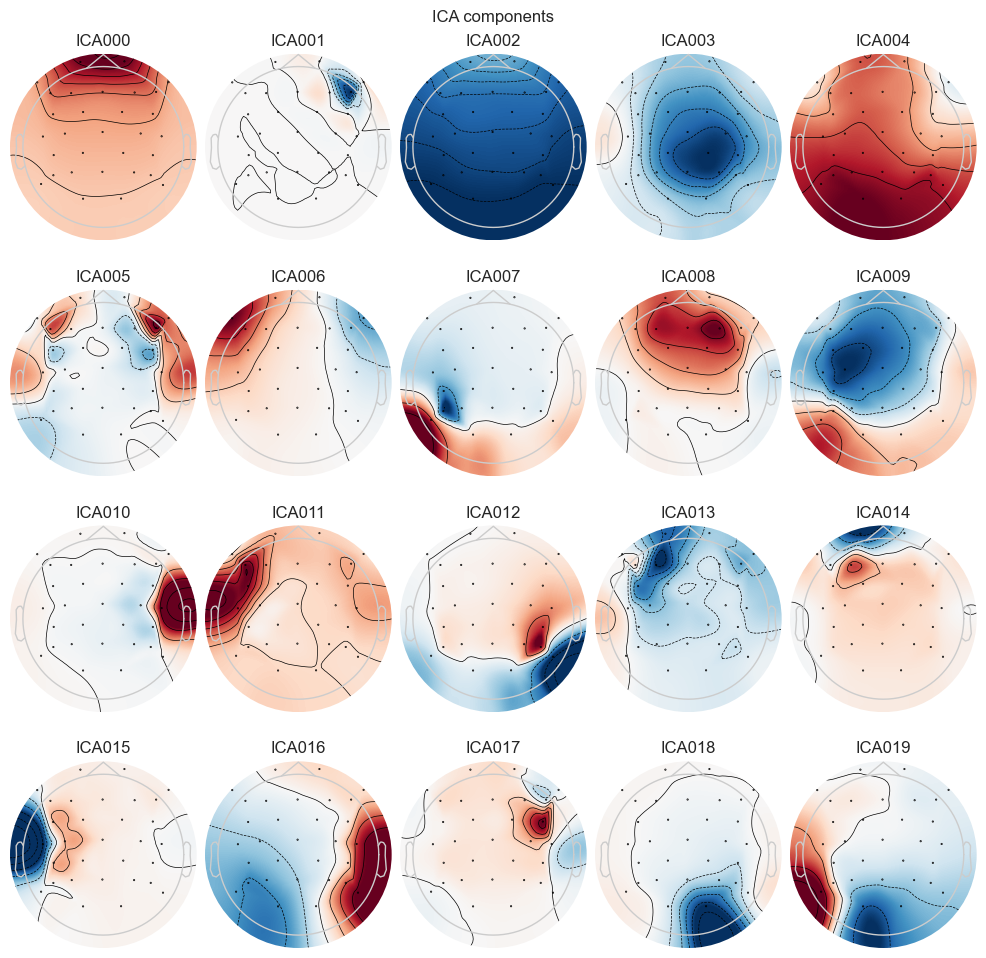

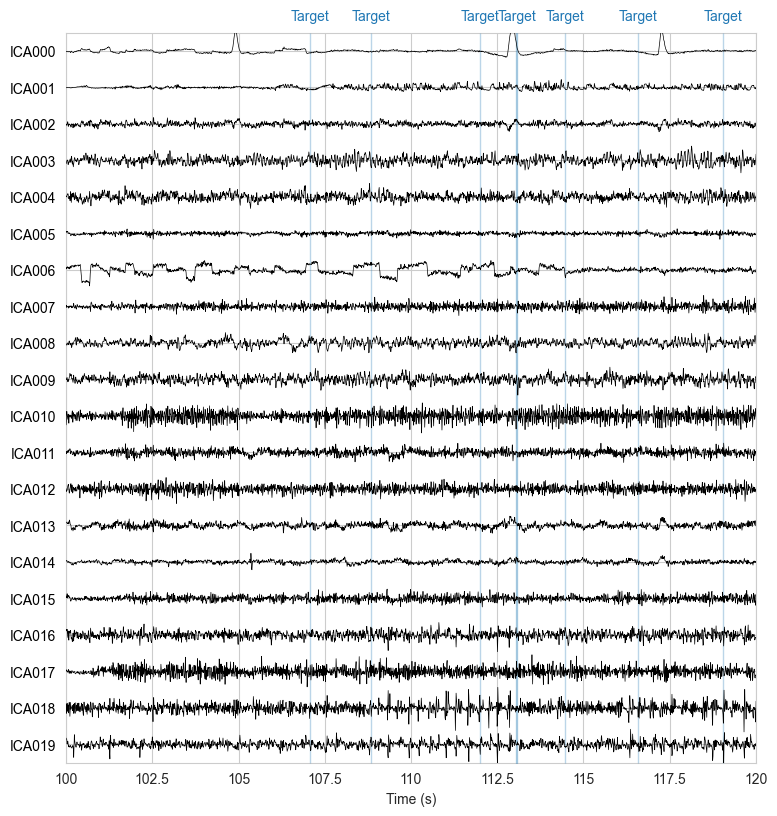

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S03-ica.fif

Processing session: P1_S04
 - Block 'block_1' duration: 1745.80 seconds


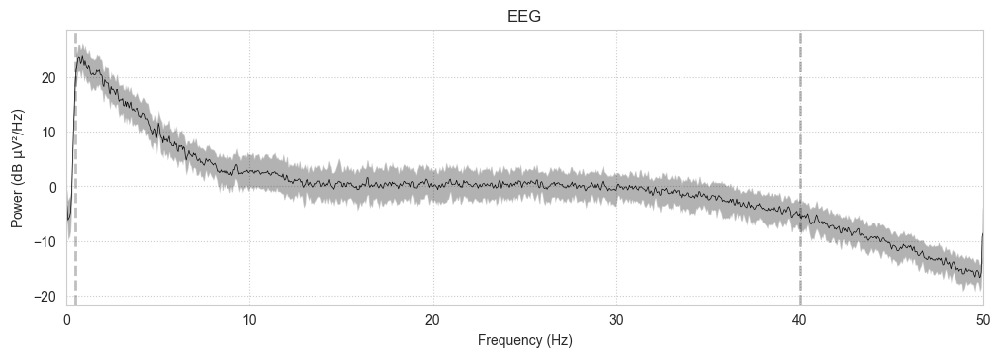

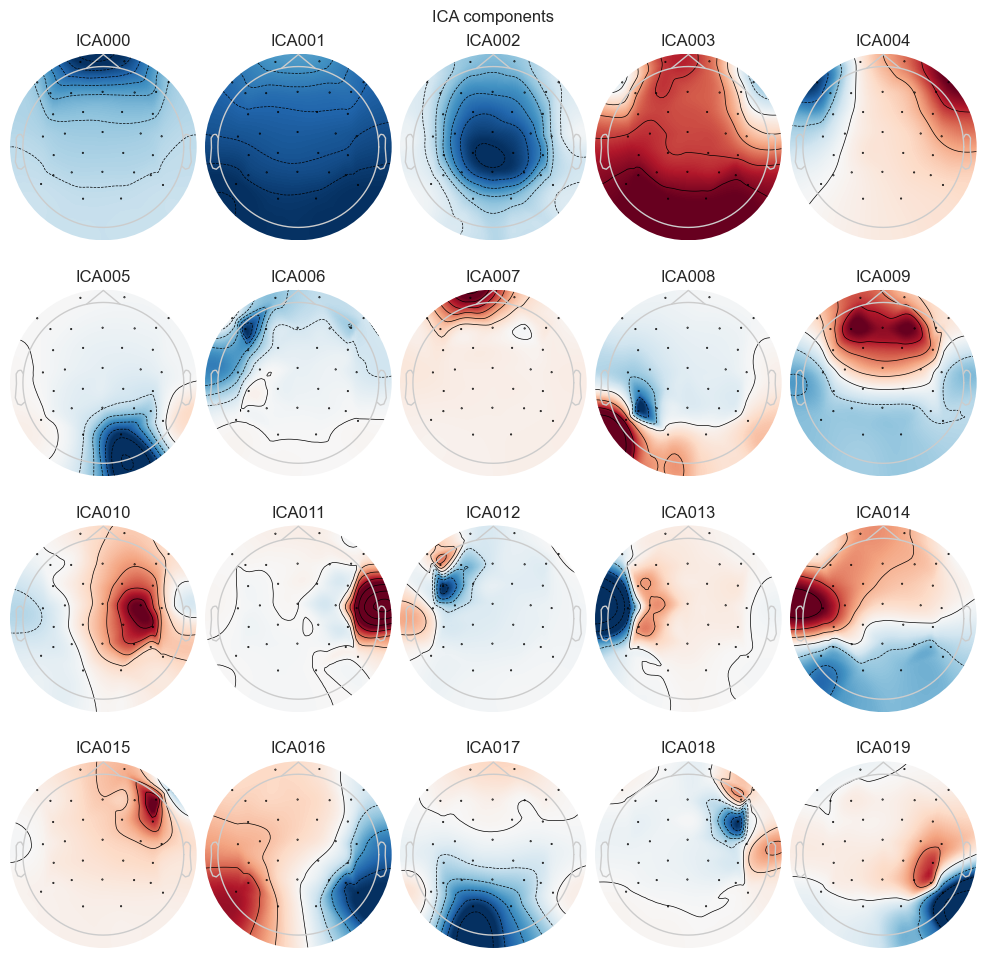

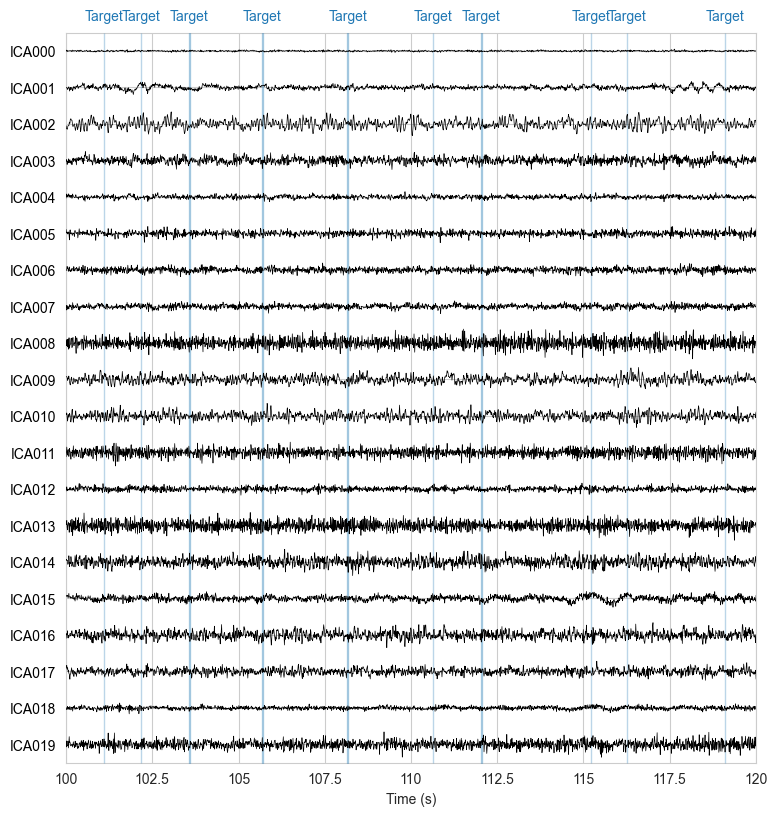

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S04-ica.fif

Processing session: P1_S05
 - Block 'block_1' duration: 1755.08 seconds


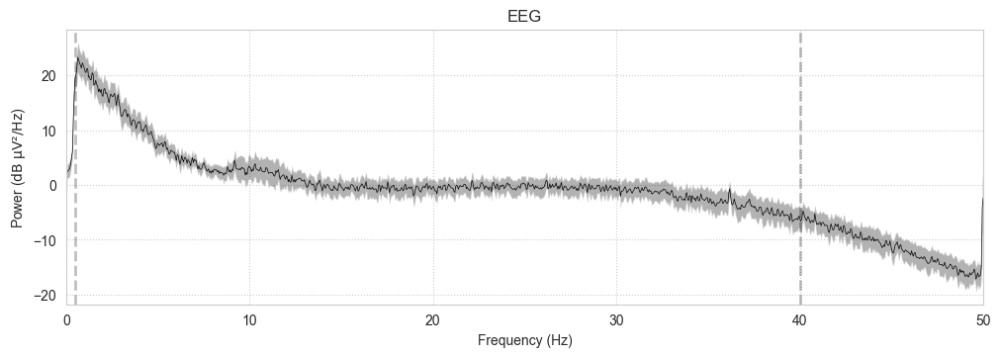

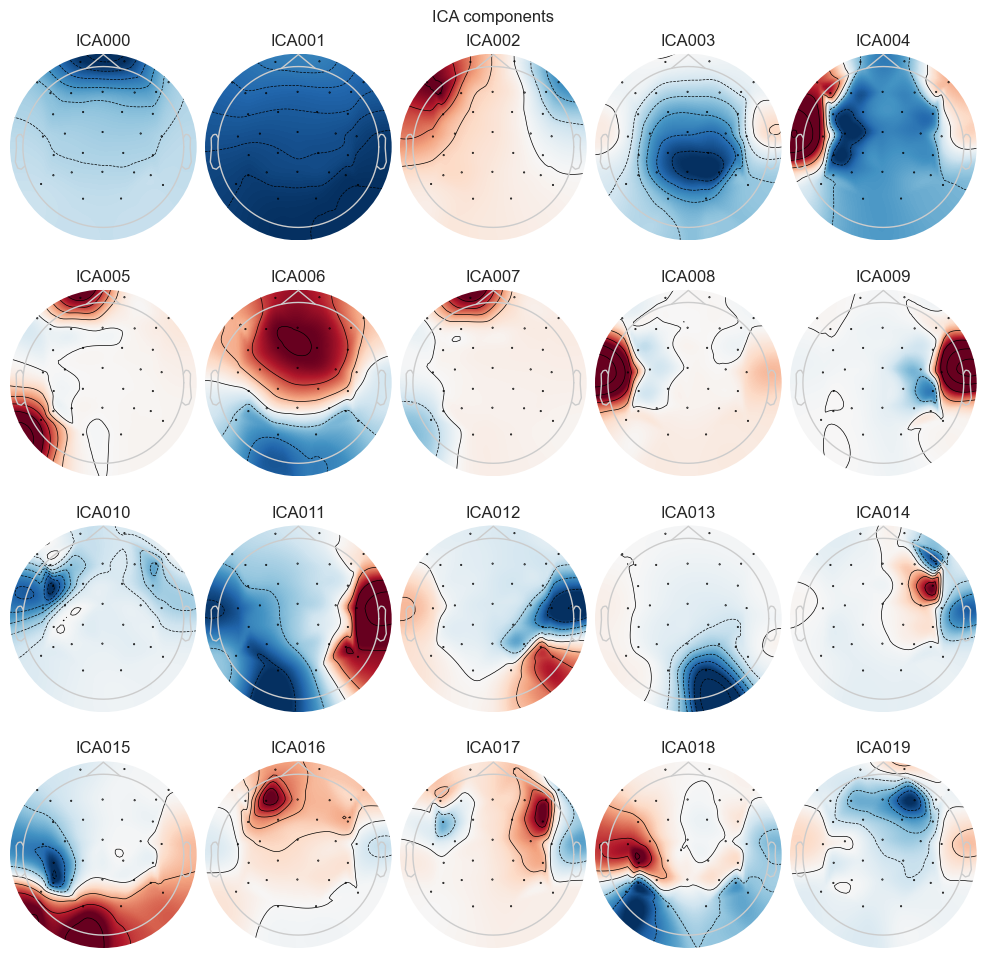

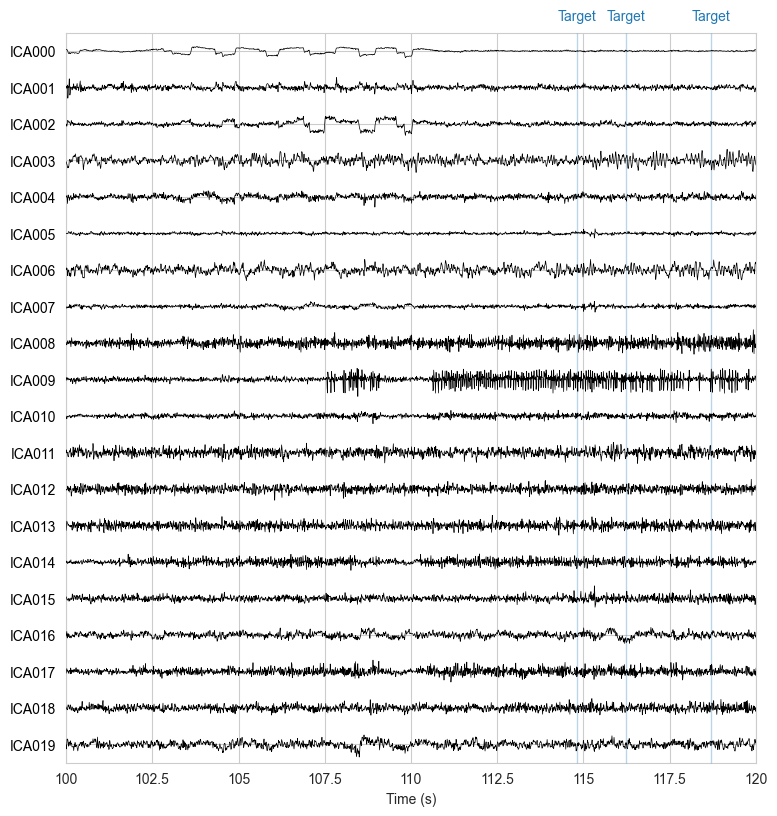

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S05-ica.fif

Processing session: P1_S06
 - Block 'block_1' duration: 1714.18 seconds


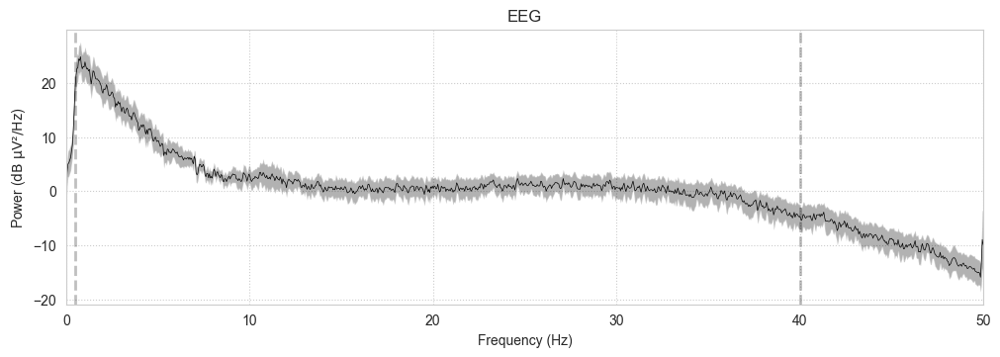

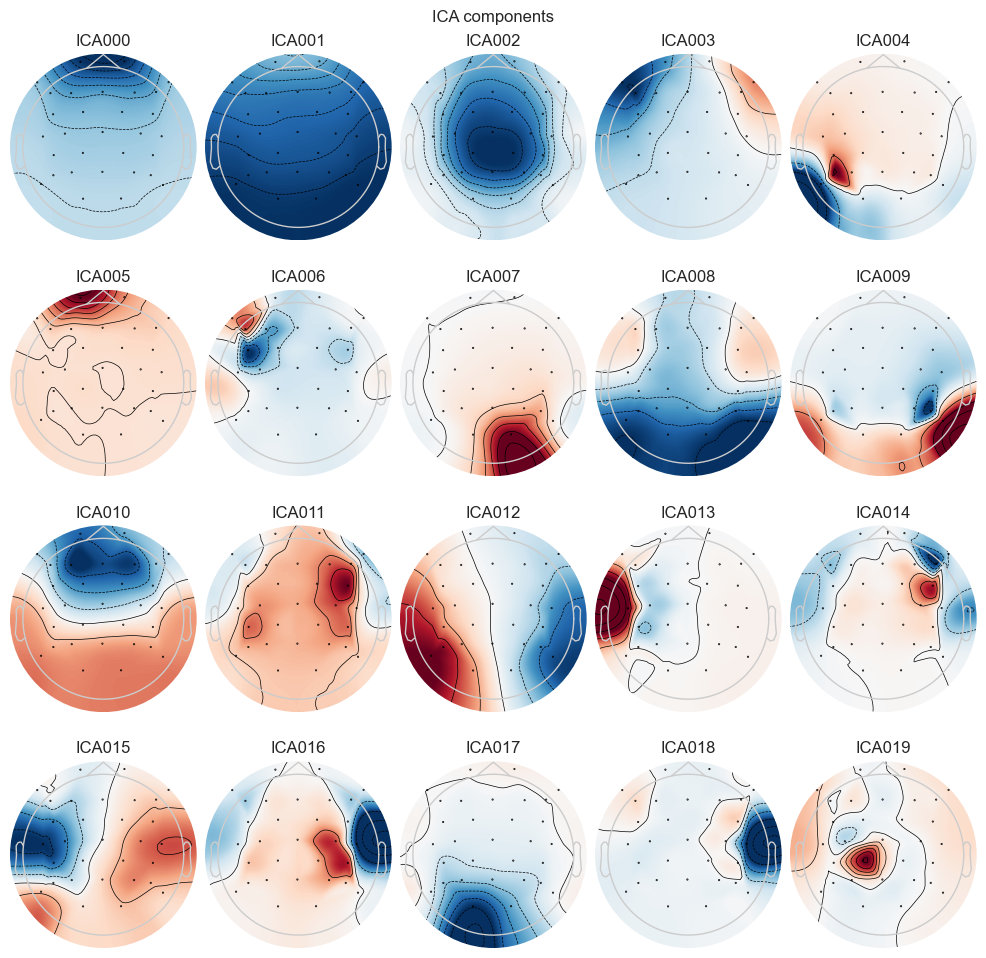

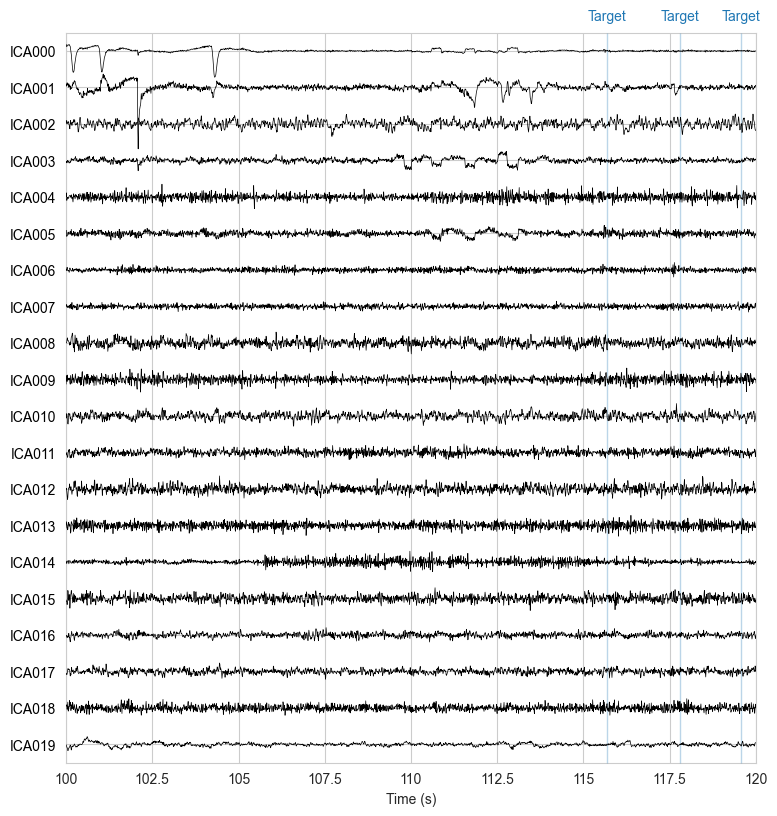

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S06-ica.fif

Processing session: P1_S07
 - Block 'block_1' duration: 1605.14 seconds


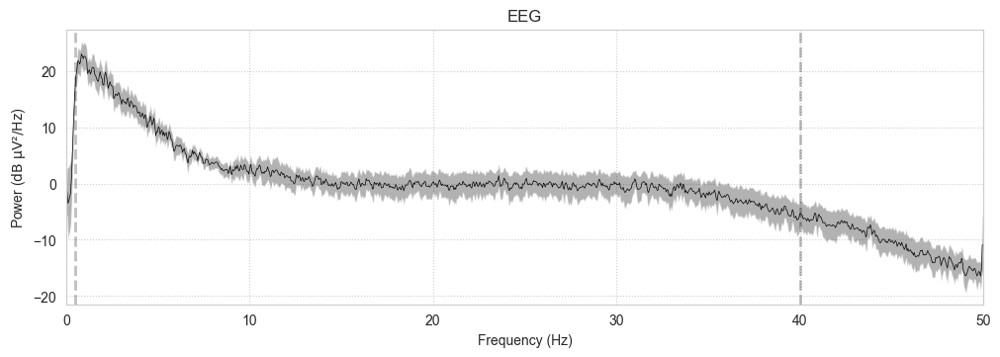

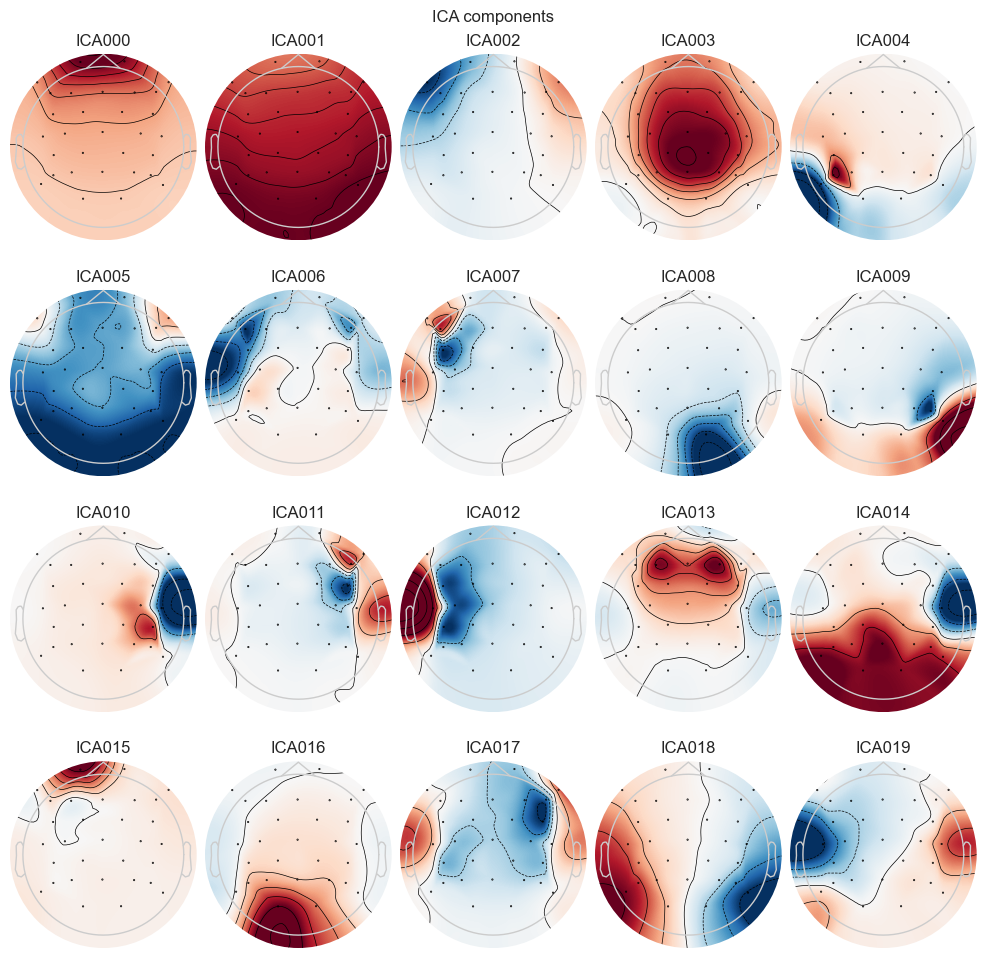

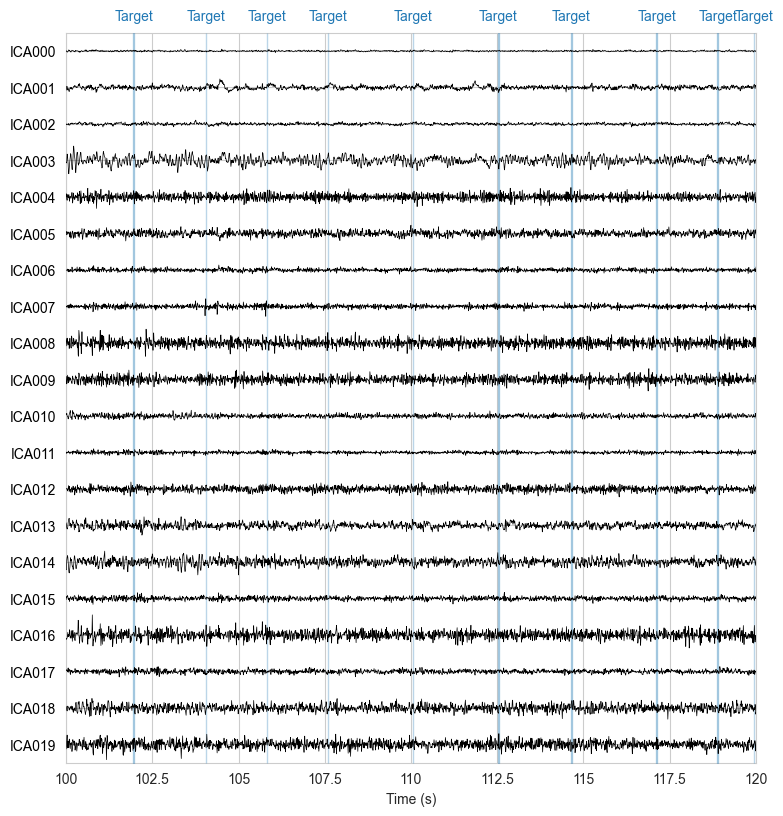

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S07-ica.fif

Processing session: P1_S08
 - Block 'block_1' duration: 1555.84 seconds


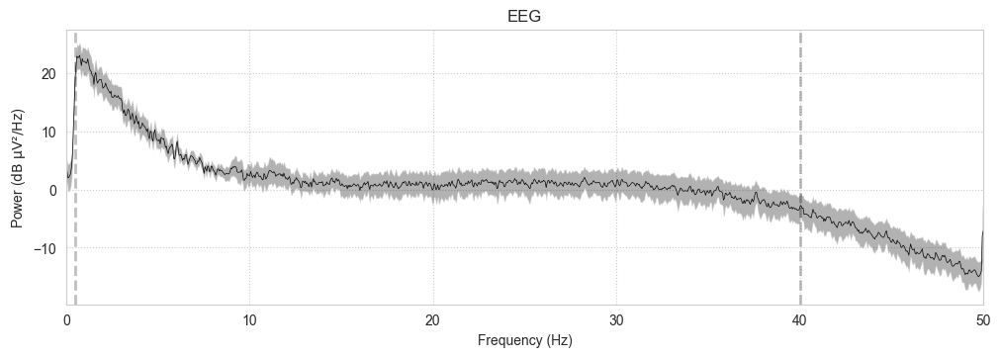

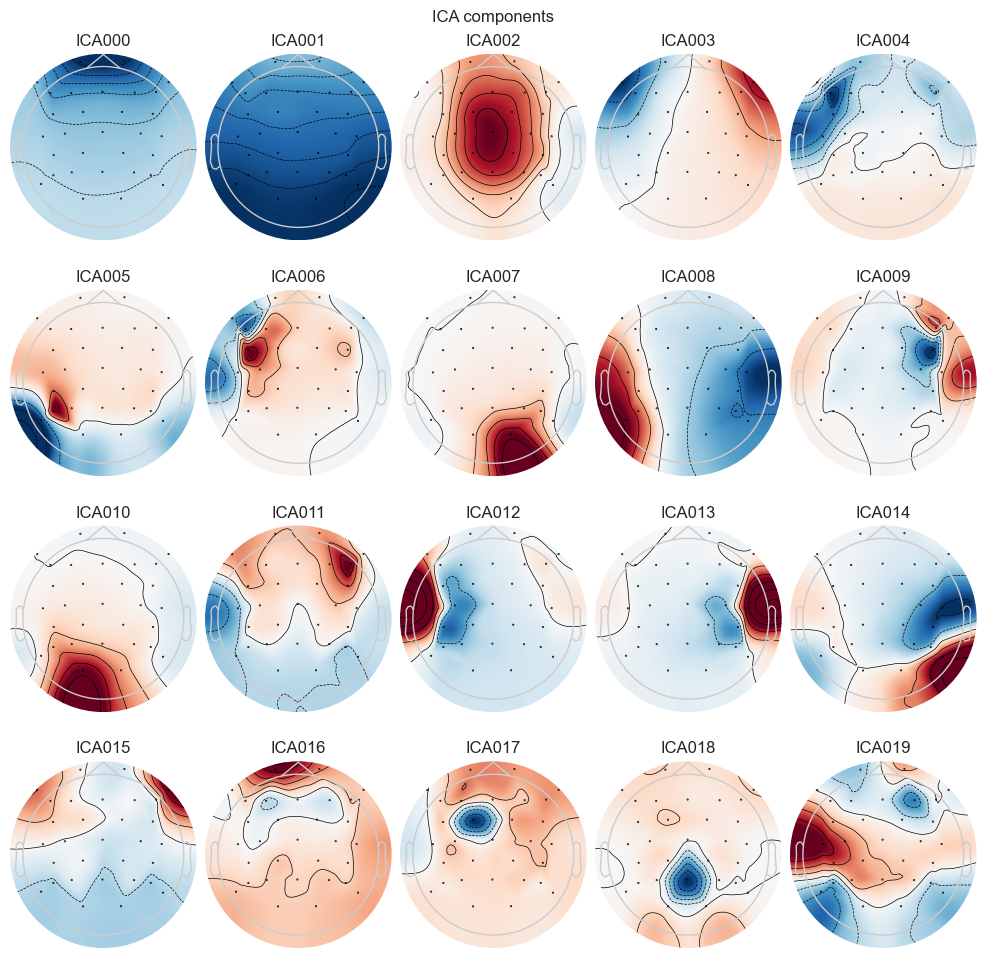

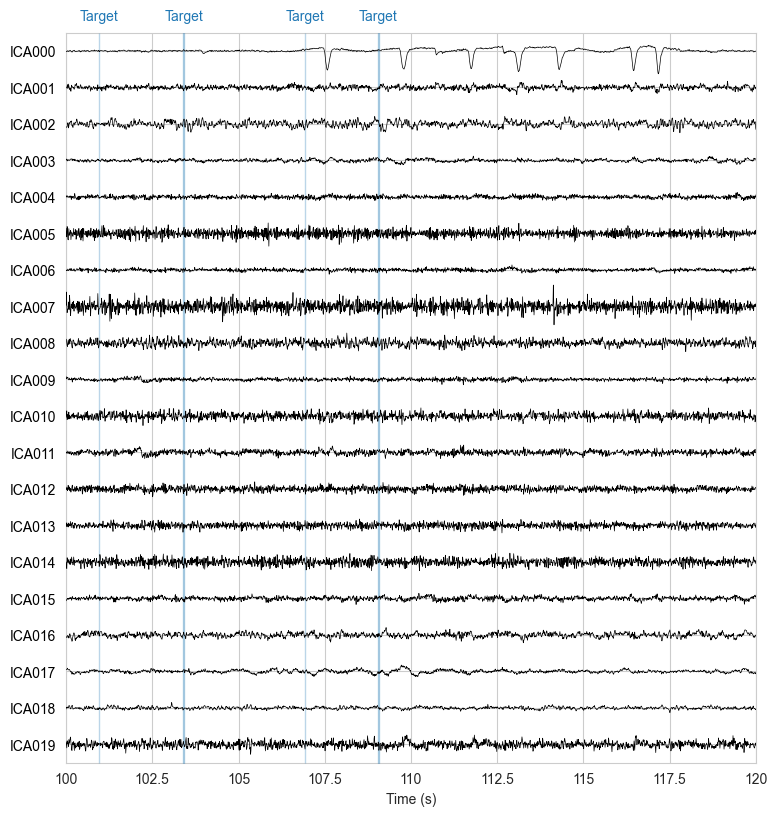

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S08-ica.fif

Processing session: P1_S09
 - Block 'block_1' duration: 1540.82 seconds


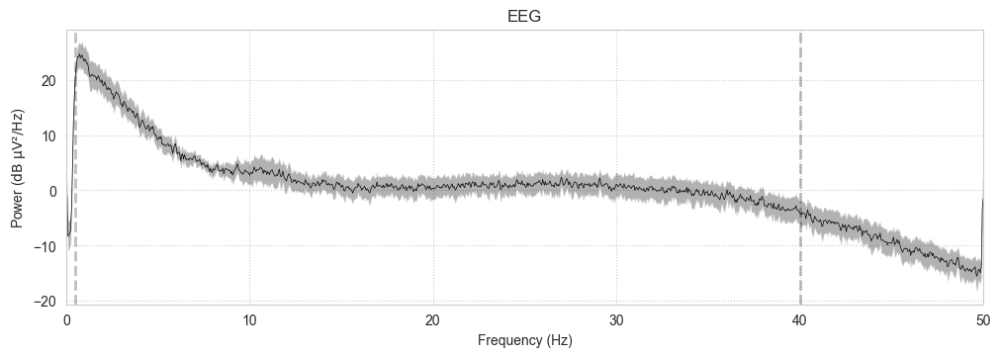

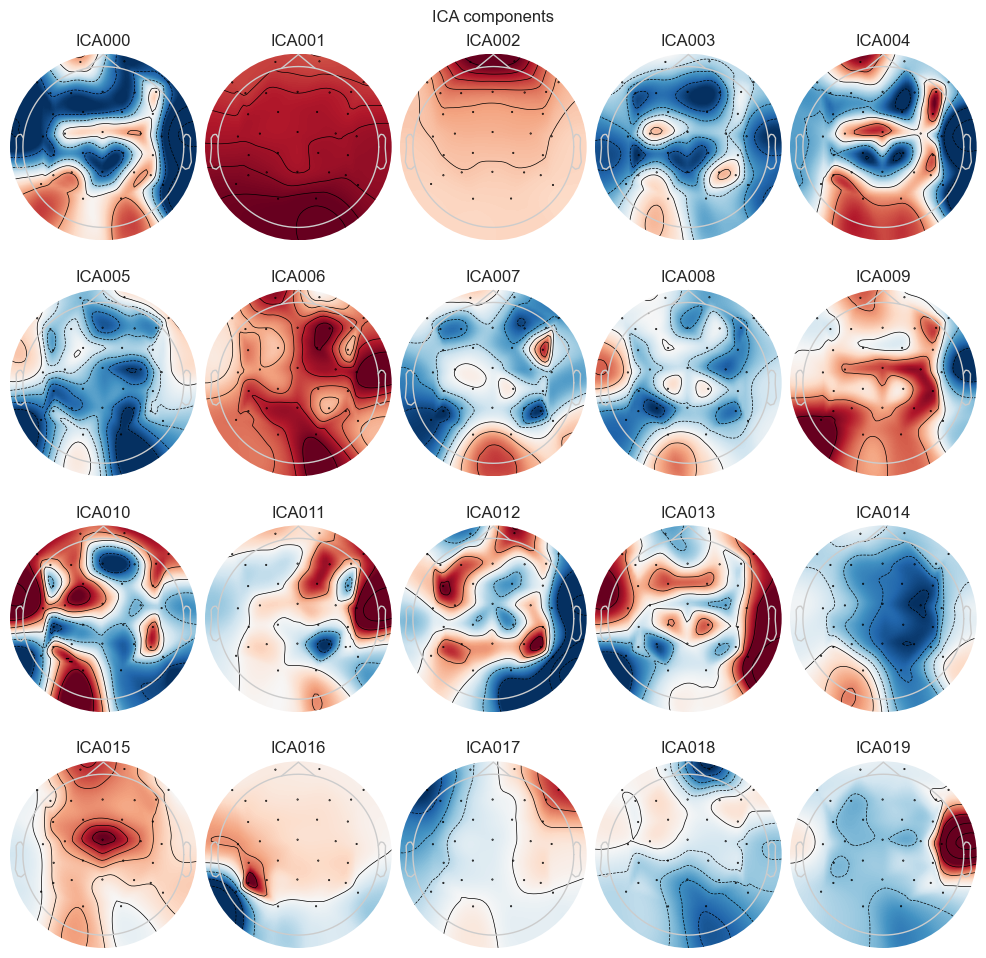

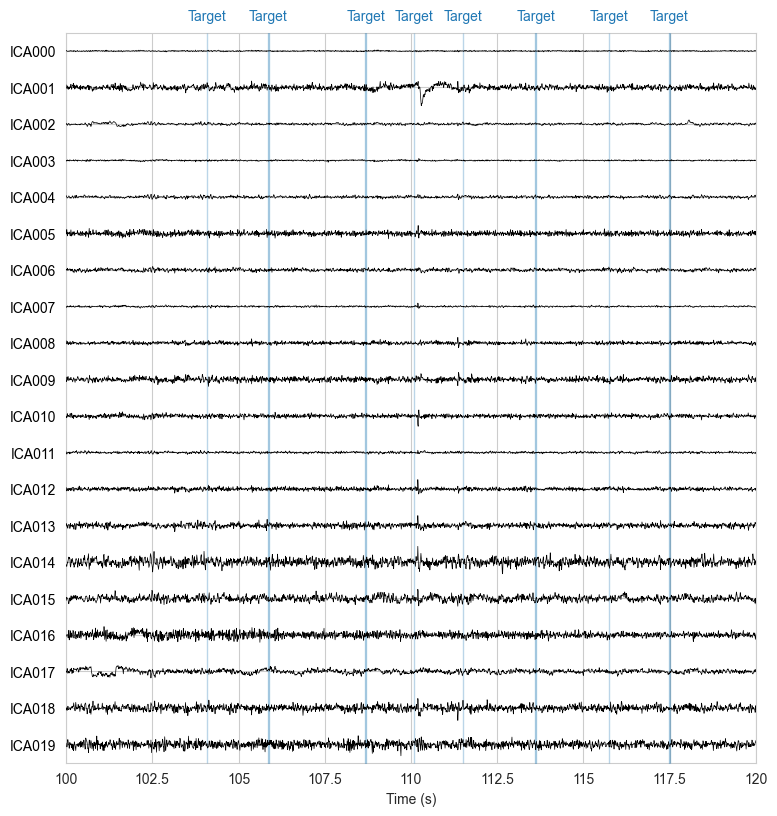

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S09-ica.fif

Processing session: P1_S10
 - Block 'block_1' duration: 1540.02 seconds


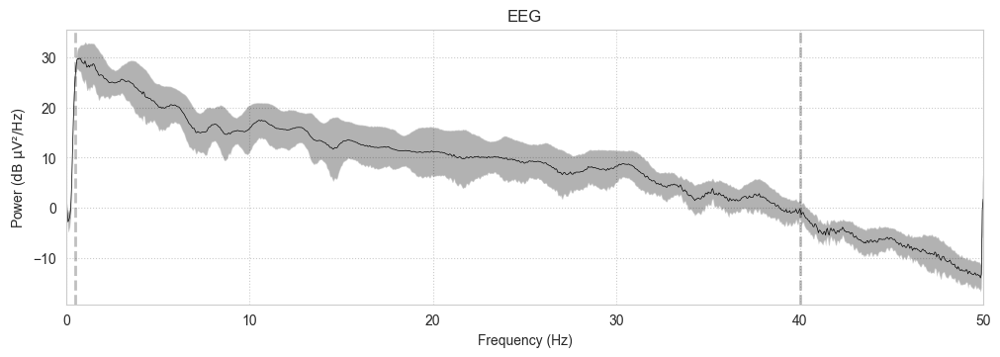

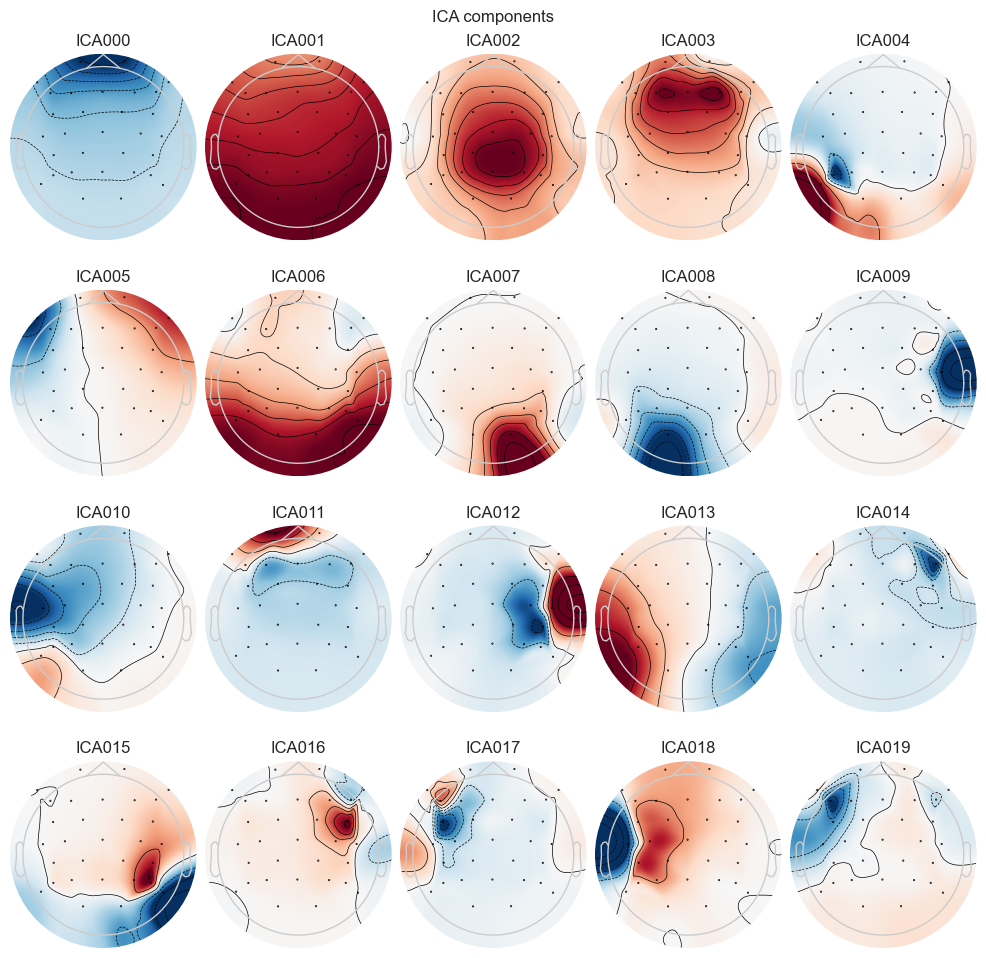

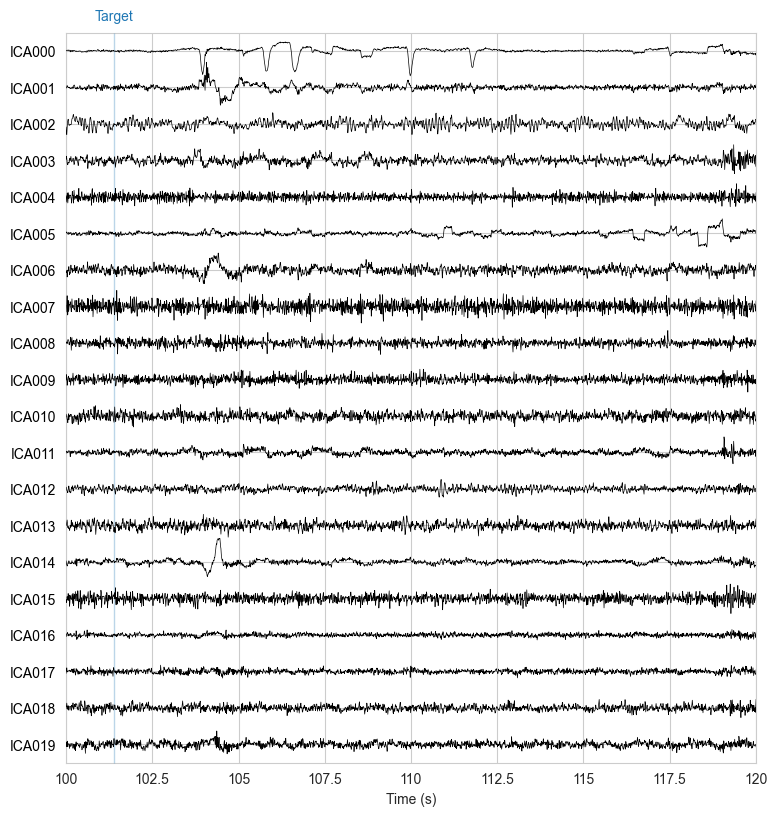

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S10-ica.fif

Processing session: P1_S11
 - Block 'block_1' duration: 1452.42 seconds


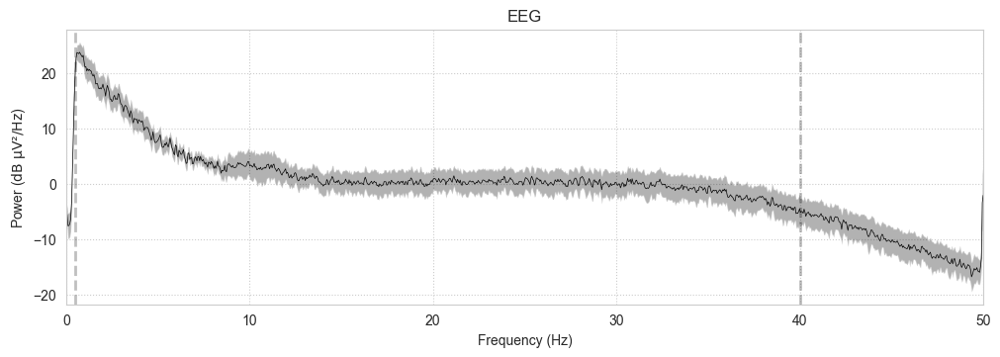

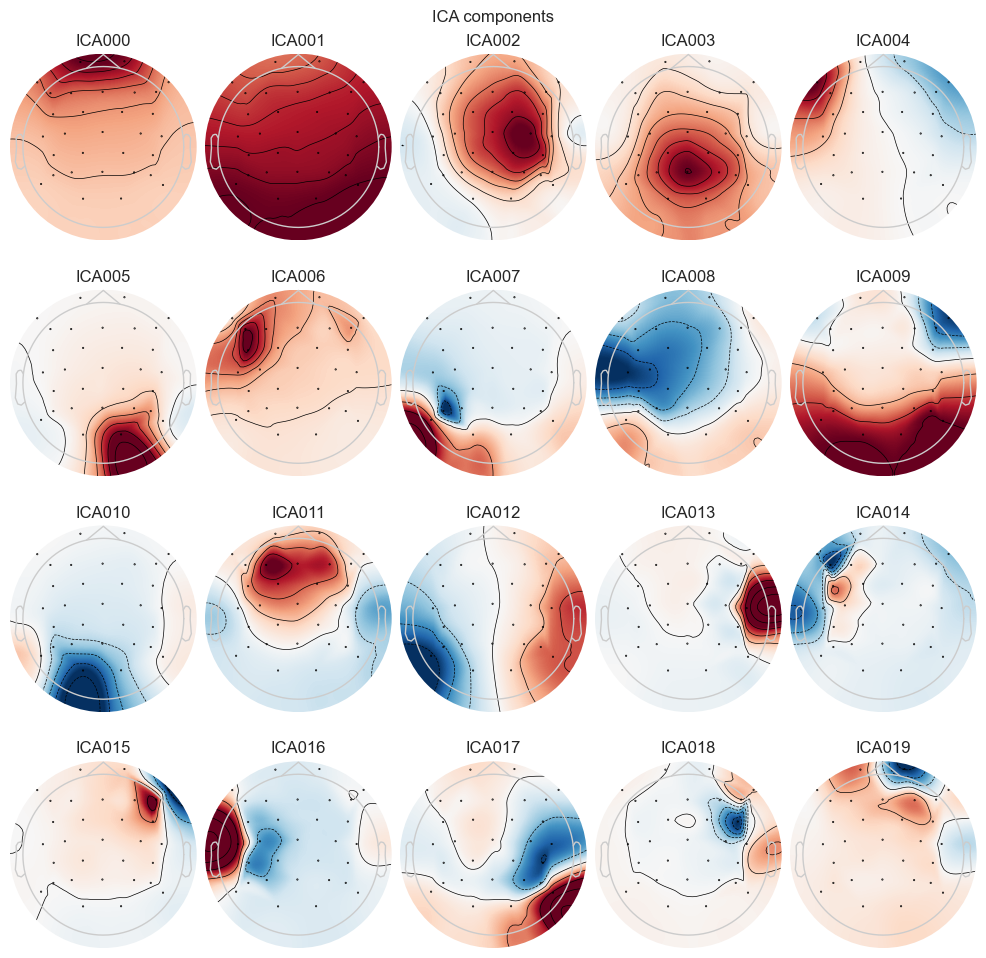

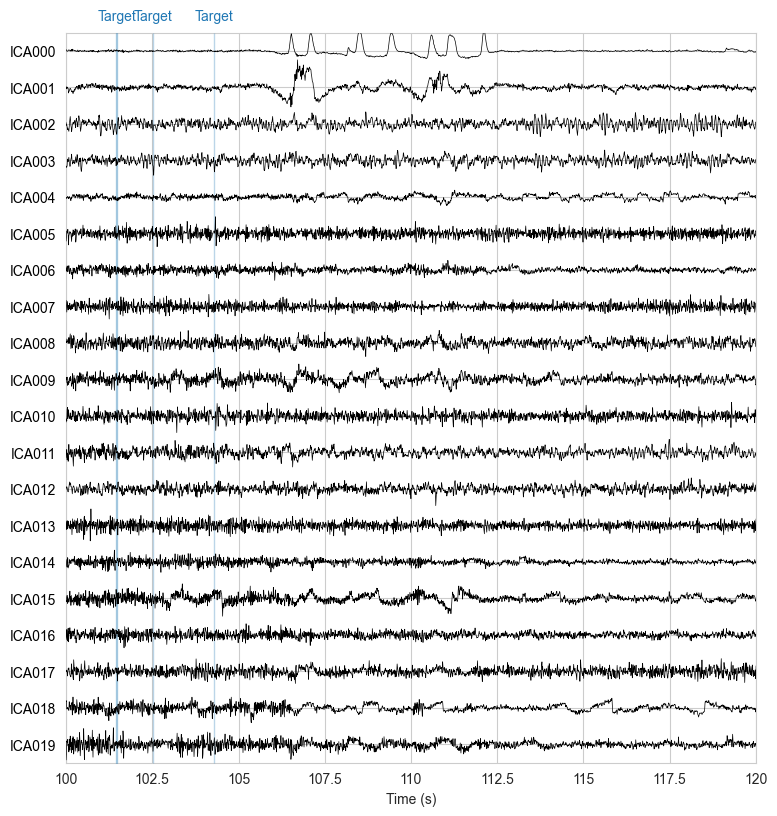

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S11-ica.fif

Processing session: P1_S12
 - Block 'block_1' duration: 1483.96 seconds


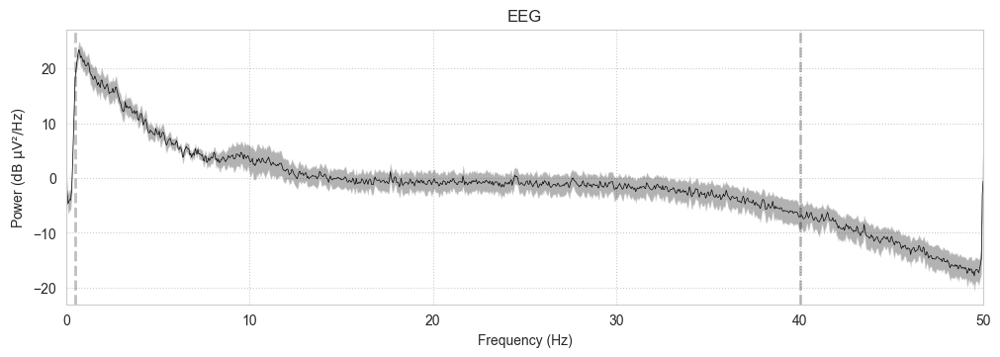

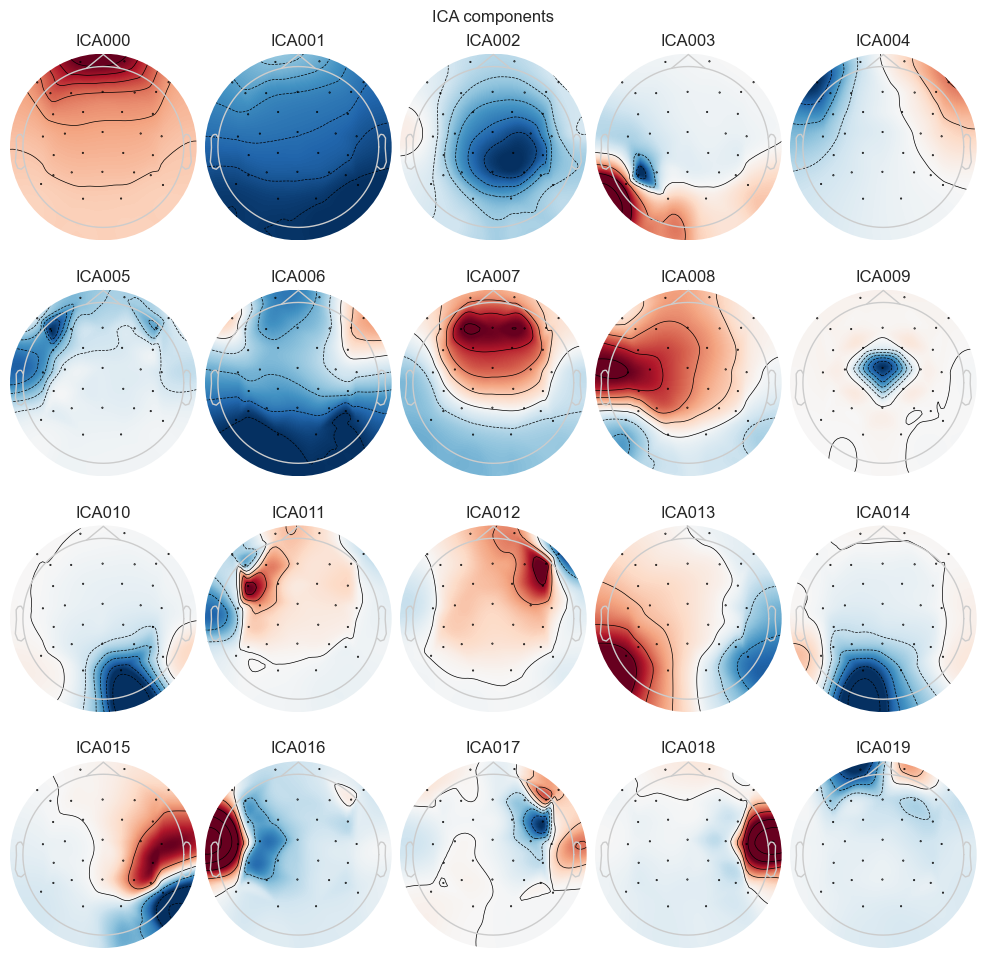

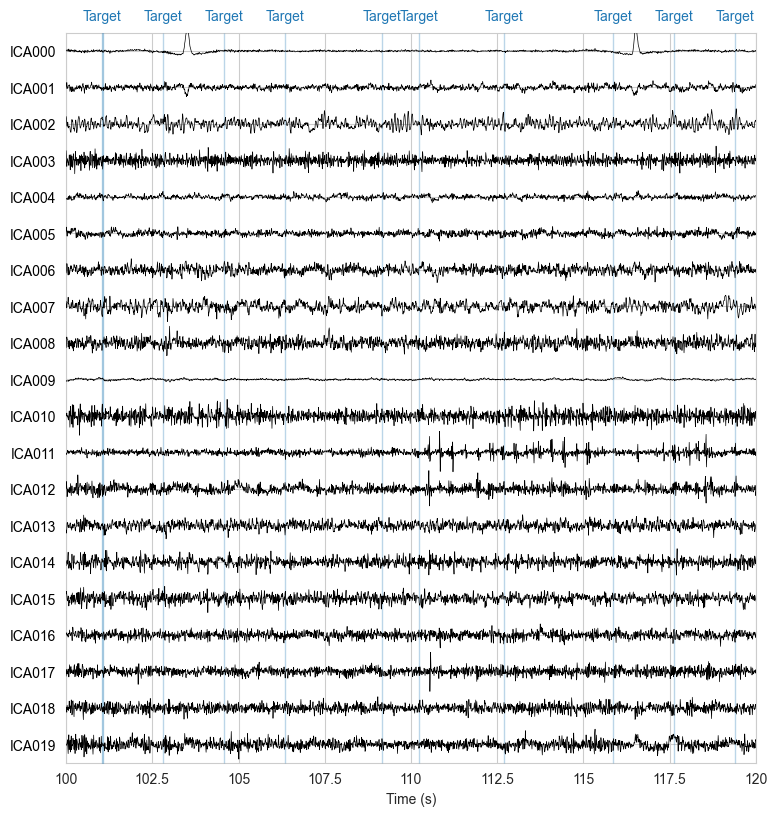

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S12-ica.fif

Processing session: P1_S13
 - Block 'block_1' duration: 1488.62 seconds


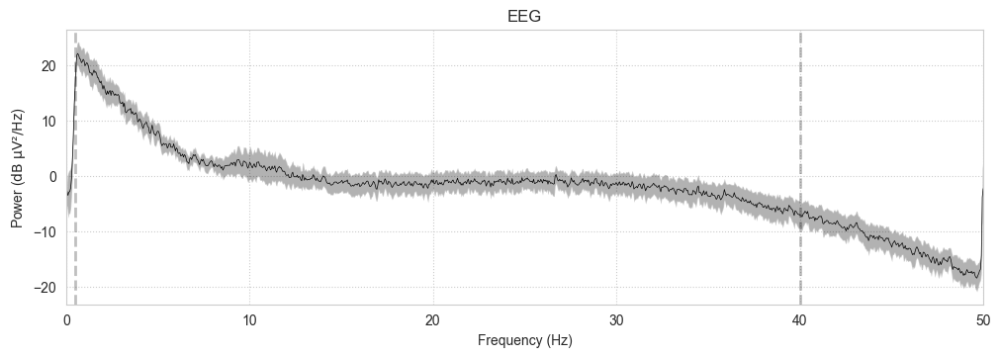

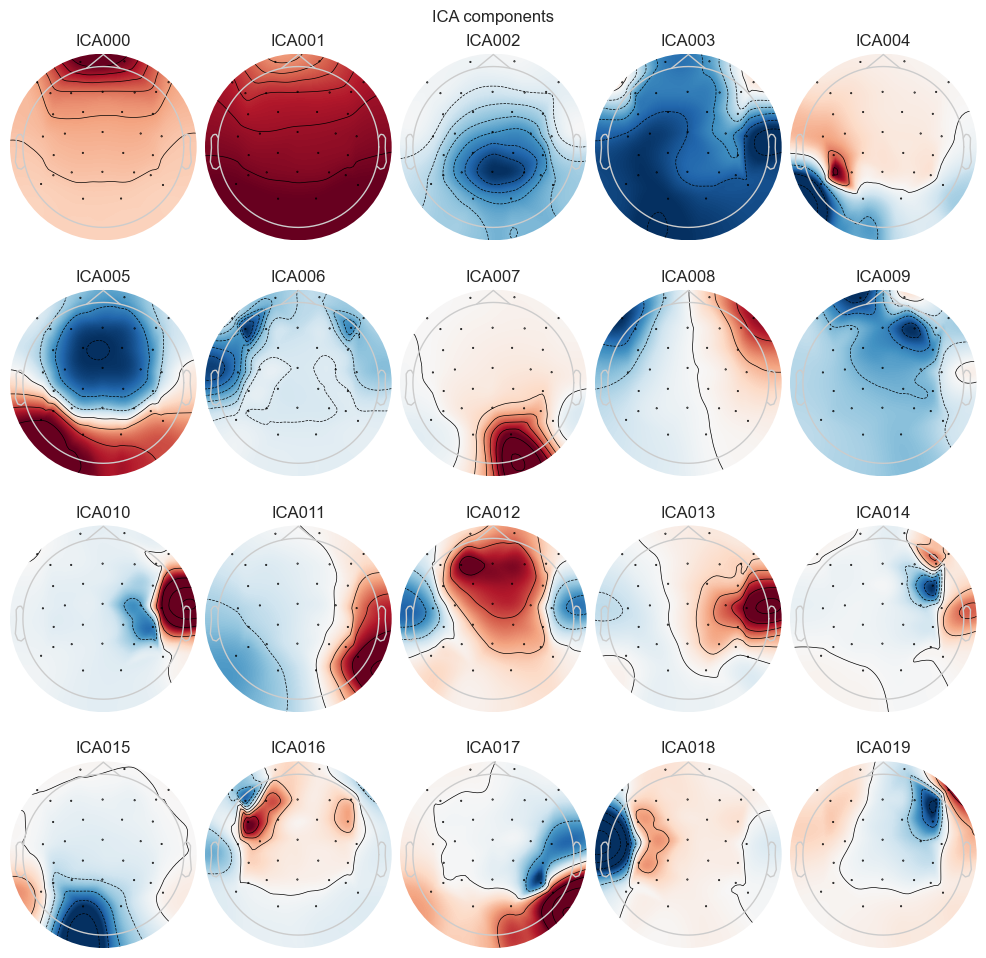

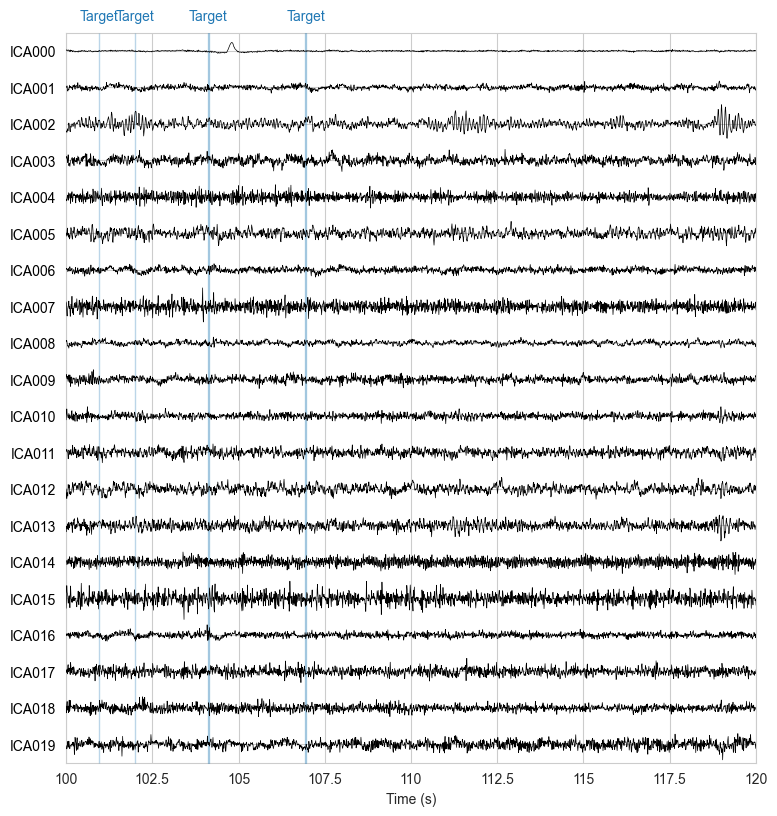

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S13-ica.fif

Processing session: P1_S14
 - Block 'block_1' duration: 1447.86 seconds


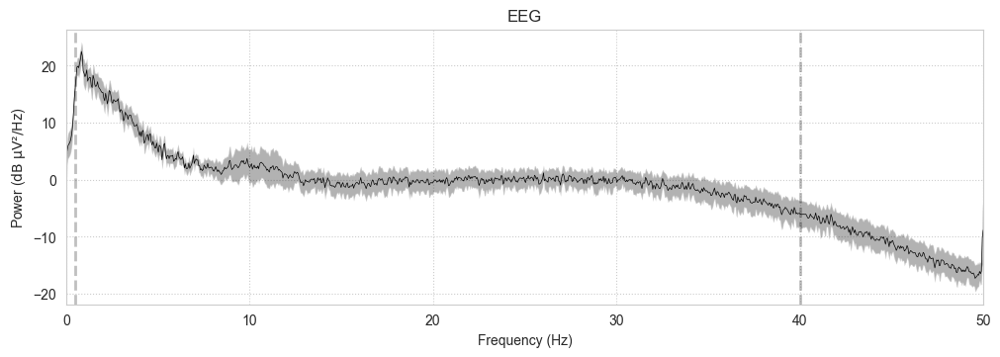

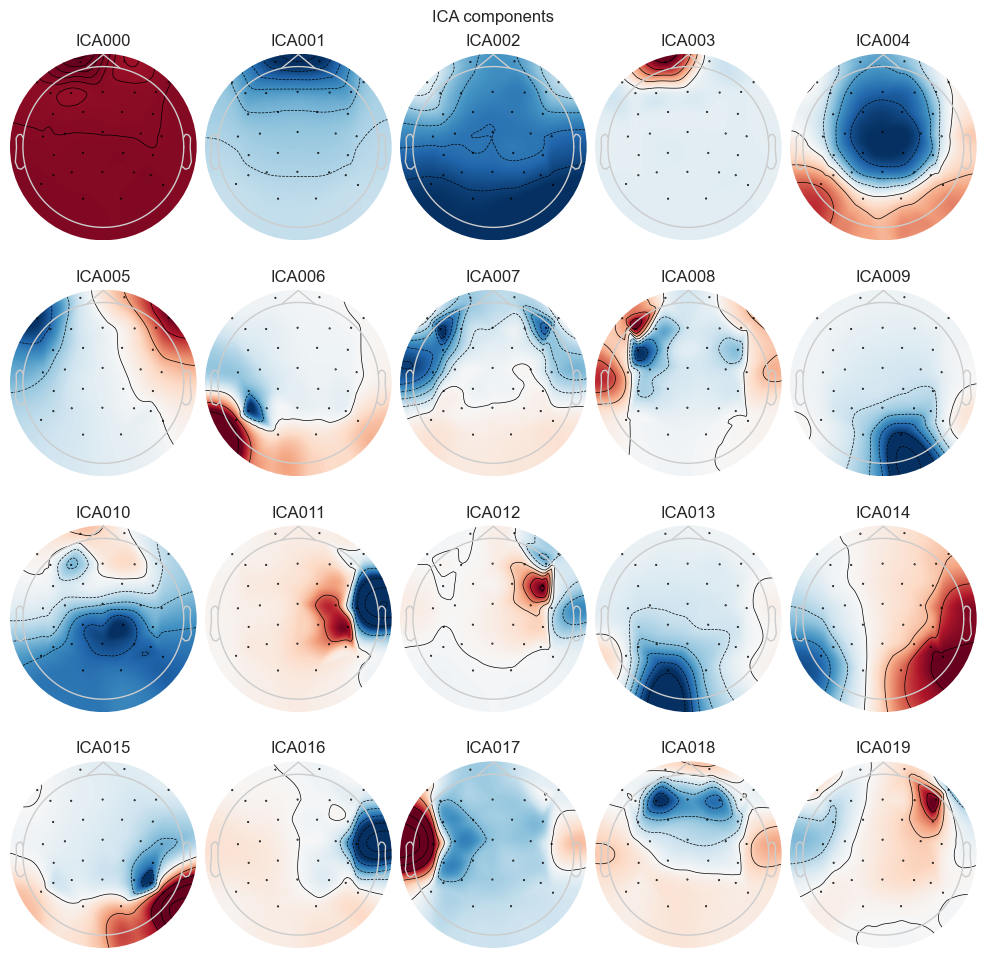

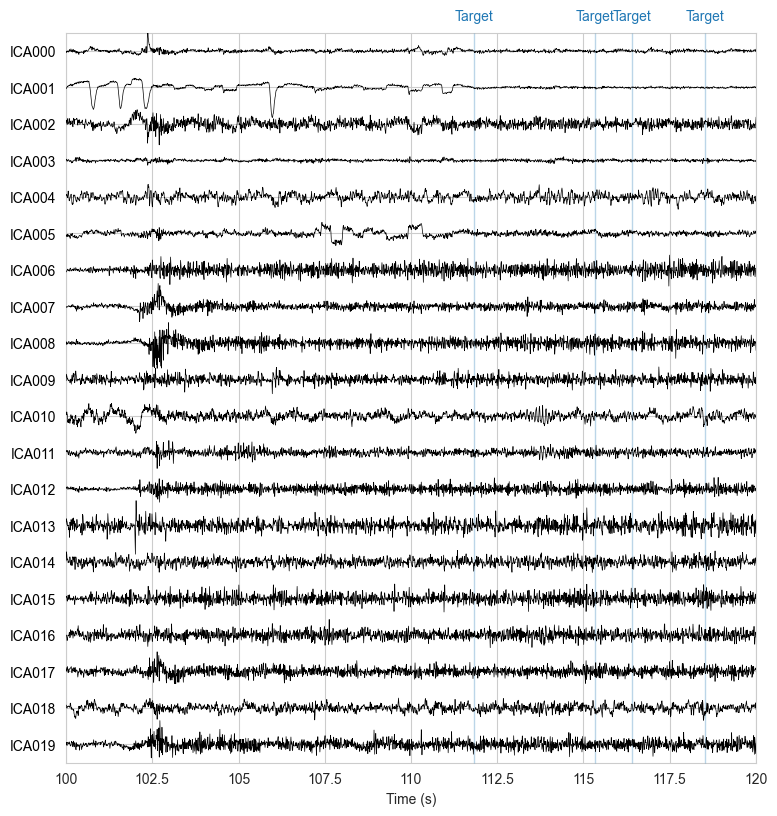

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S14-ica.fif

Processing session: P1_S15
 - Block 'block_1' duration: 1447.30 seconds


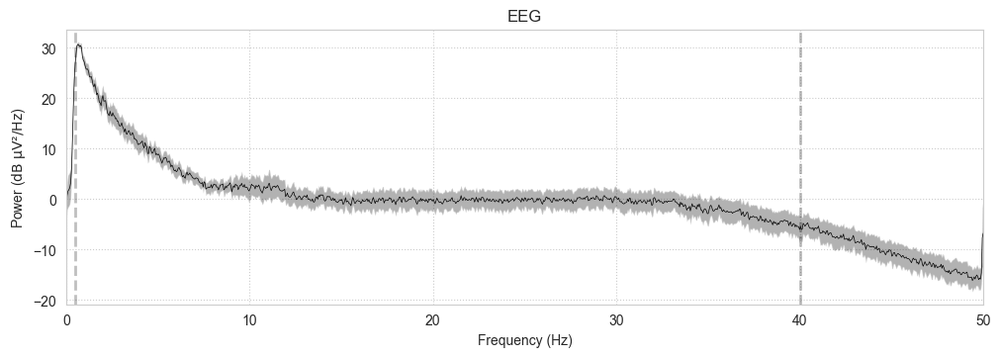

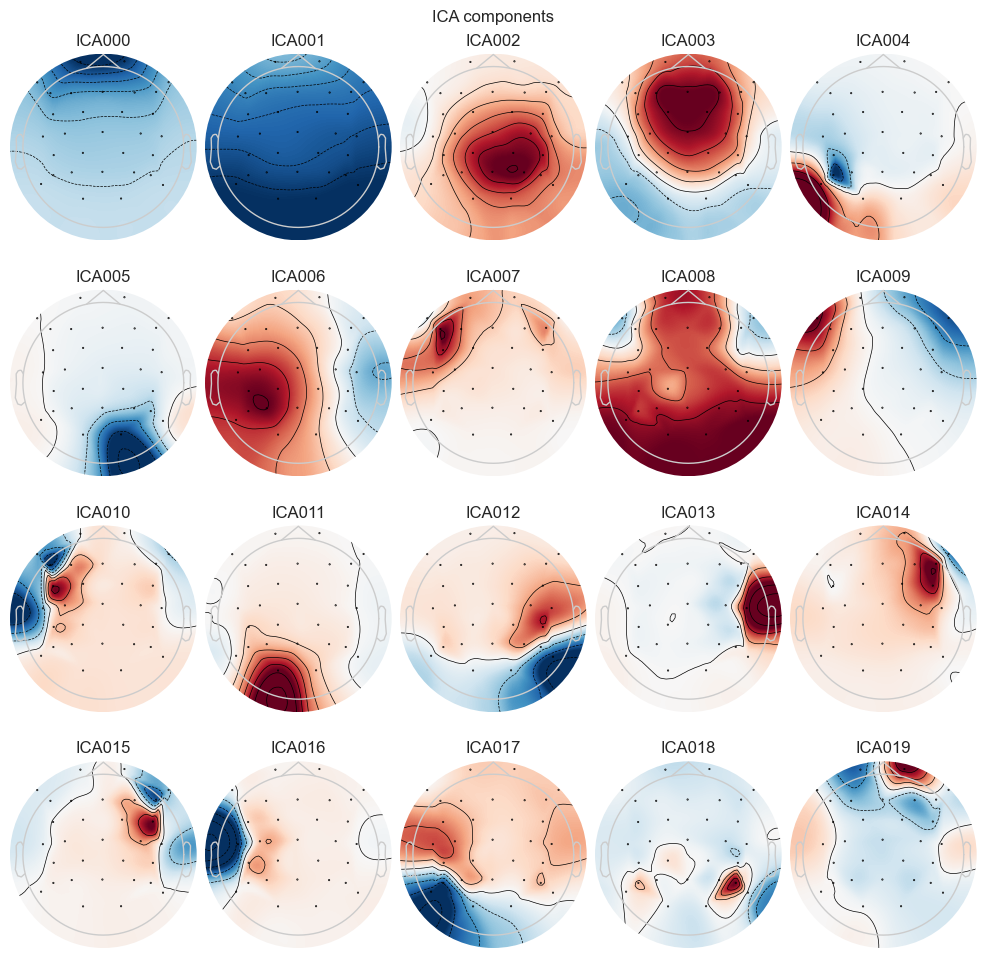

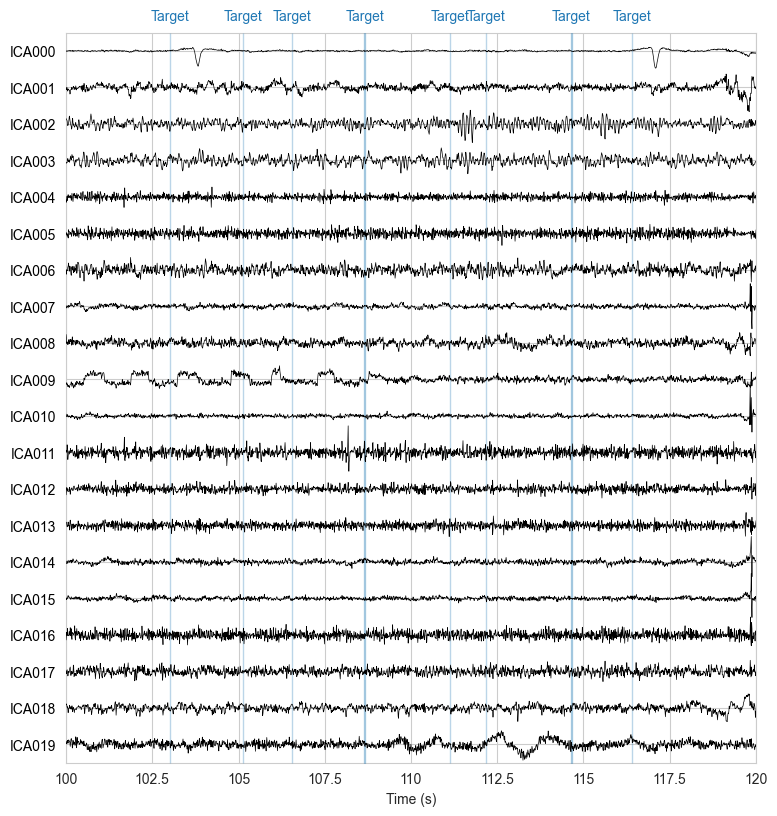

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S15-ica.fif

Processing session: P1_S16
 - Block 'block_1' duration: 1453.60 seconds


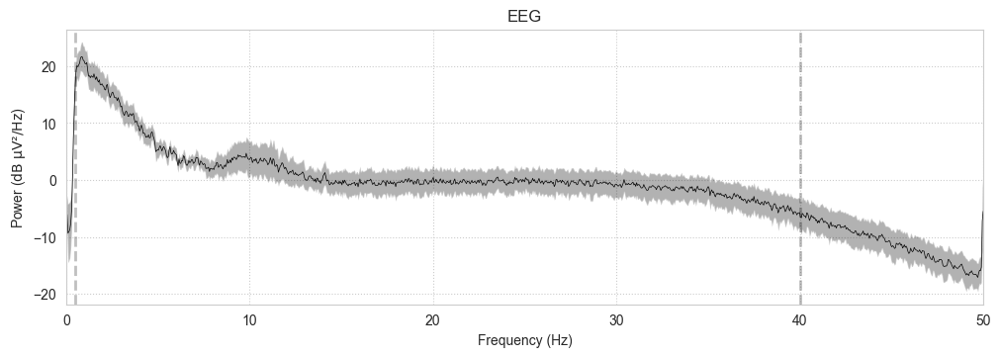

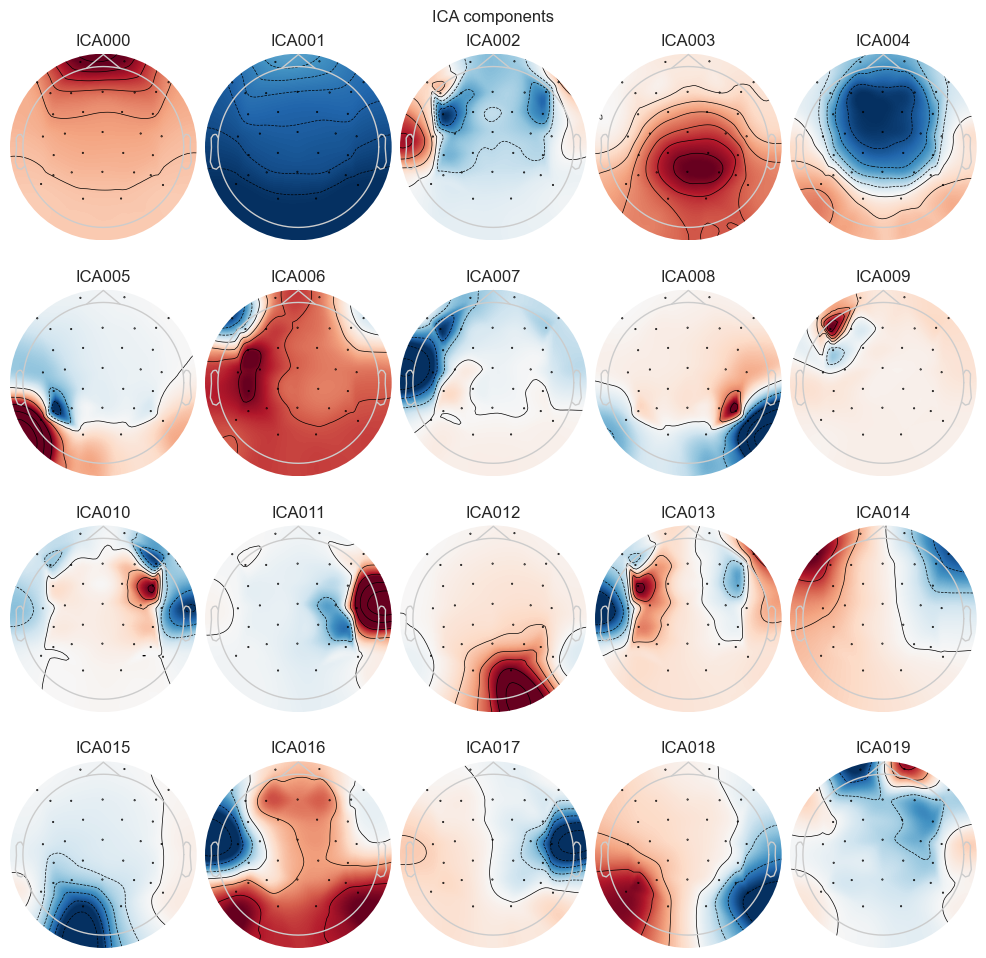

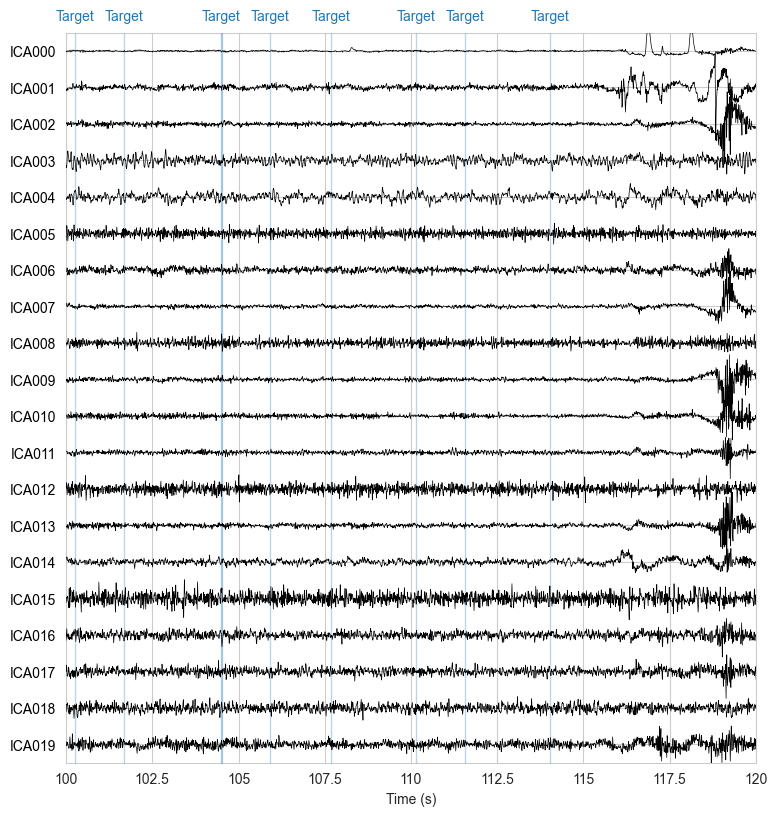

/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


ICA saved to: /Volumes/Lexar/ica_outputs/P1_S16-ica.fif

Processing session: P1_S17
 - Block 'block_1' duration: 1443.02 seconds


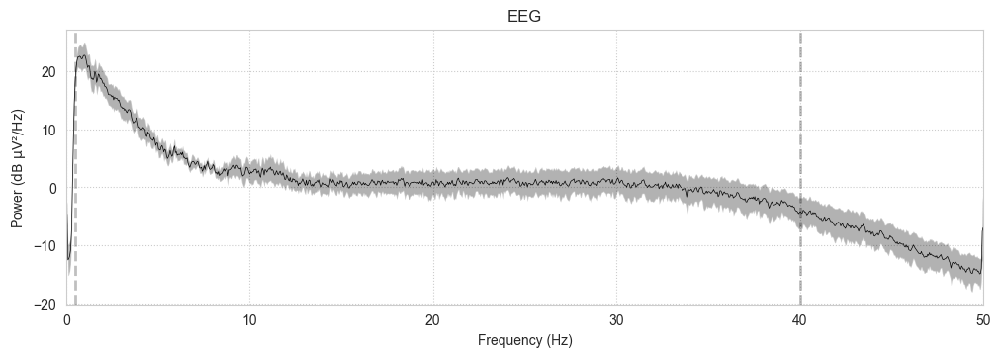

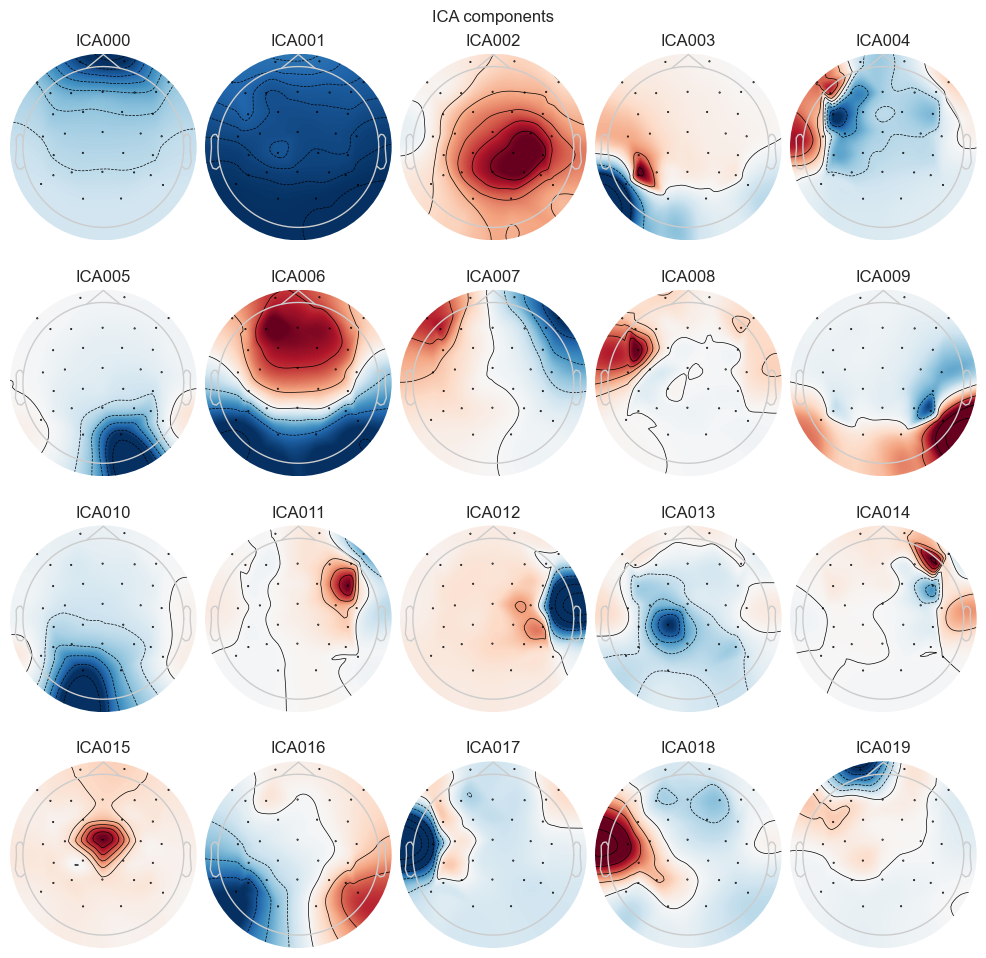

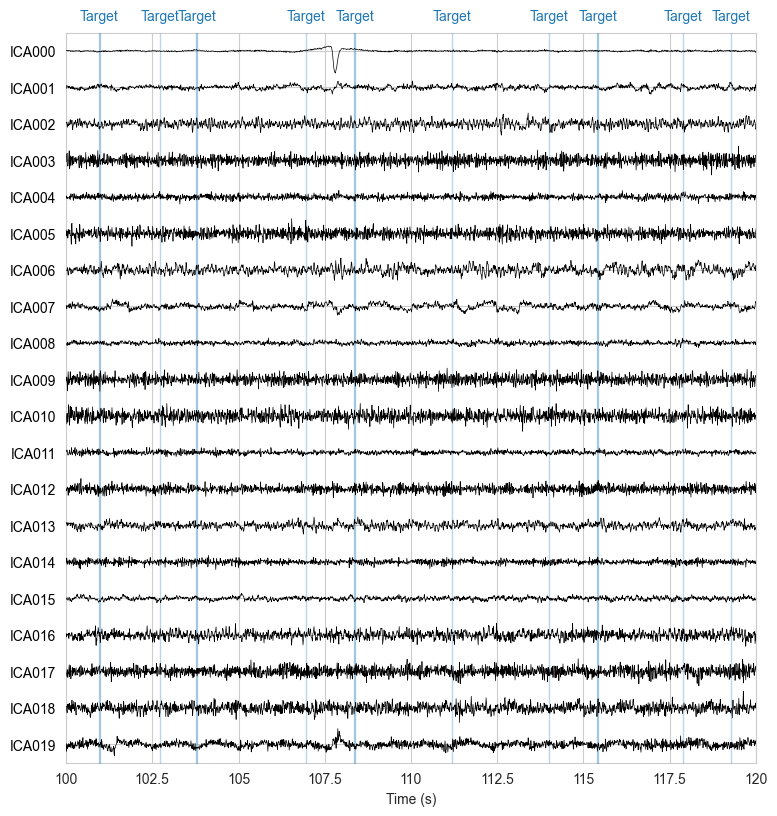

ICA saved to: /Volumes/Lexar/ica_outputs/P1_S17-ica.fif


/Users/Sophia/Docs/Uni/B3/BSc_thesis/code auditory oddball/toeplitzlda_venv/lib/python3.12/site-packages/mne/viz/utils.py:158: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


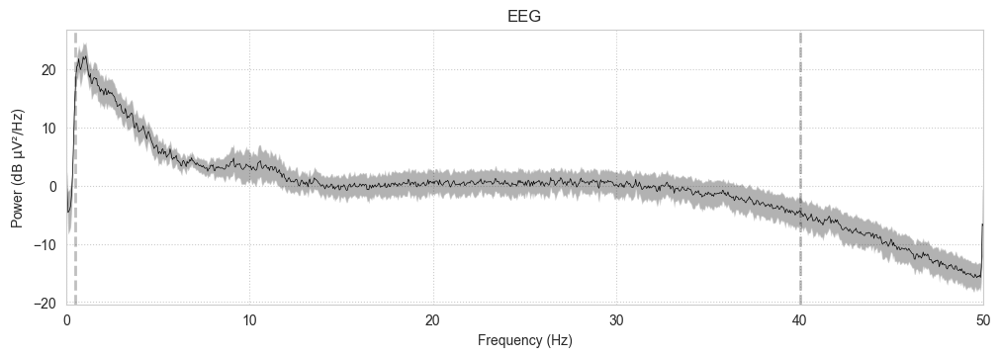

In [ ]:
def plot_raw_summary(raw):

    # Time series plot
    raw.plot(n_channels=30, start=100, duration=20, scalings='auto', show=True)

    # Topomap of channel locations
    #raw.plot_sensors(kind='topomap', show_names=True)


def run_and_save_ica_for_all_sessions(data, ica_dir, ica_method='fastica', random_state=97, max_iter=500):

    os.makedirs(ica_dir, exist_ok=True)
    print(f"Saving ICA components to: {ica_dir}")

    for session_name, blocks in data.items():
        print(f"\nProcessing session: {session_name}")

        first_block_name = sorted(blocks.keys())[0]
        first_block_runs = blocks[first_block_name]

        # Concatenate runs in the first block
        raw_runs = [run_raw.copy() for run_raw in first_block_runs.values()]
        raw_block = mne.concatenate_raws(raw_runs, preload=True)
        # If you want to plot additional information
        #plot_raw_summary(raw_block)

        duration = raw_block.n_times / raw_block.info['sfreq']
        print(f" - Block '{first_block_name}' duration: {duration:.2f} seconds")

        # Keep useful channels for ICA
        raw_block.pick_types(eeg=True, eog=False, ecg=False, emg=False, misc=False)
        
        # Fit ICA
        ica = ICA(
            n_components=20,
            method=ica_method,
            random_state=random_state,
            max_iter=max_iter
        )
        ica.fit(raw_block)
        
        
        # Find and plot target IDs
        events, event_id = mne.events_from_annotations(raw_block)

        target_event_ids = {
            key: val for key, val in event_id.items()
            if key.startswith("Stimulus/S11") and 111 <= int(key.split("/S")[1]) <= 116
        }

        target_event_values = list(target_event_ids.values())
        target_events = events[np.isin(events[:, 2], target_event_values)]
        
        onsets = target_events[:, 0] / raw_block.info['sfreq']
        durations = np.zeros(len(onsets))  
        descriptions = ["Target"] * len(onsets)

        target_annotations = mne.Annotations(
            onset=onsets,
            duration=durations,
            description=descriptions,
            orig_time=raw_block.info['meas_date']
        )
        
        raw_block.set_annotations(target_annotations)

        # plot scores (only if applicable)
        #ica.plot_scores(ica.score_sources(raw_block_for_scores , target='EOGvu'))  # For blink-related
        #ica.plot_scores(ica.score_sources(raw_block_for_scores, target='x_Pulse'))  # For heartbeat-related
        #ica.plot_scores(ica.score_sources(raw_block_for_scores, target='x_EMGl'))  # For muscle-related
        
        # Plot 
        ica.plot_components()
        ica.plot_sources(raw_block, start=100, stop=120, show_scrollbars=False)

        raw_block.compute_psd(tmax=np.inf, fmax=50).plot(average=True, amplitude=False, picks="data", exclude="bads")

        # Save ICA
        ica_fname = os.path.join(ica_dir, f"{session_name}-ica.fif")
        ica.save(ica_fname, overwrite=True)
        print(f"ICA saved to: {ica_fname}")
        

run_and_save_ica_for_all_sessions(data, ica_dir)



#### Applying ICA, training and testing

In [ ]:
# saves the artifacts into a pandas dataframe
df_ics = pd.DataFrame([
    {'session': 'P01_S03', 'artifact_ics': [0, 6]},
    {'session': 'P01_S04', 'artifact_ics': [0,4]},
    {'session': 'P01_S05', 'artifact_ics': [0,2]},
    {'session': 'P01_S06', 'artifact_ics': [0,3]},
    {'session': 'P01_S07', 'artifact_ics': [0,2]},
    {'session': 'P01_S08', 'artifact_ics': [0,3]},
    {'session': 'P01_S09', 'artifact_ics': [2,17]},
    {'session': 'P01_S10', 'artifact_ics': [0,5]},
    {'session': 'P01_S11', 'artifact_ics': [0,4]},
    {'session': 'P01_S12', 'artifact_ics': [0,4]},
    {'session': 'P01_S13', 'artifact_ics': [0,8]},
    {'session': 'P01_S14', 'artifact_ics': [1,5]} ,
    {'session': 'P01_S15', 'artifact_ics': [0,9]},
    {'session': 'P01_S16', 'artifact_ics': [0,14]},
    {'session': 'P01_S17', 'artifact_ics': [0,7]}
])

# Example: to access artifact ICs for a specific session
session = 'P01_S04'
artifact_ics = df_ics.loc[df_ics['session'] == session, 'artifact_ics'].values[0]
print(artifact_ics)


[0, 4]


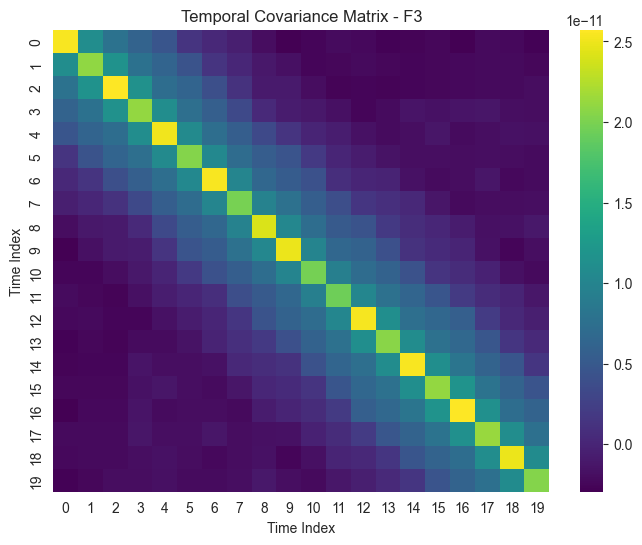

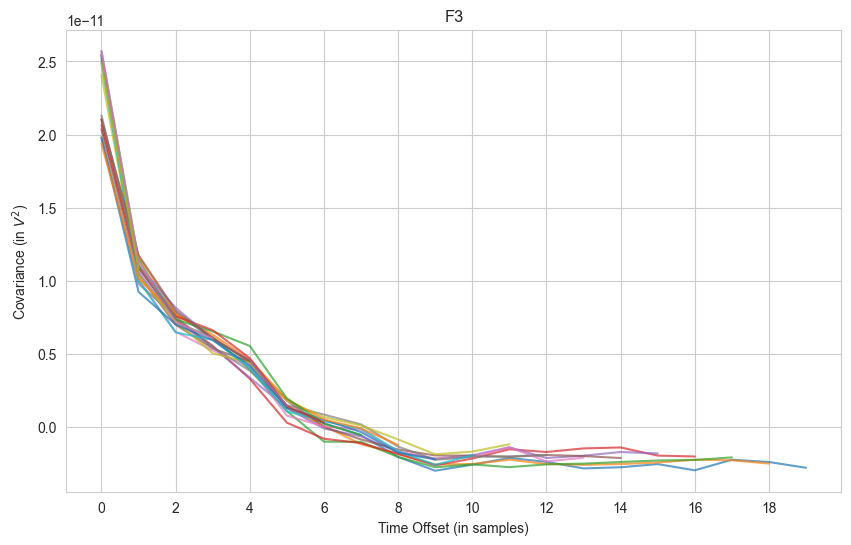

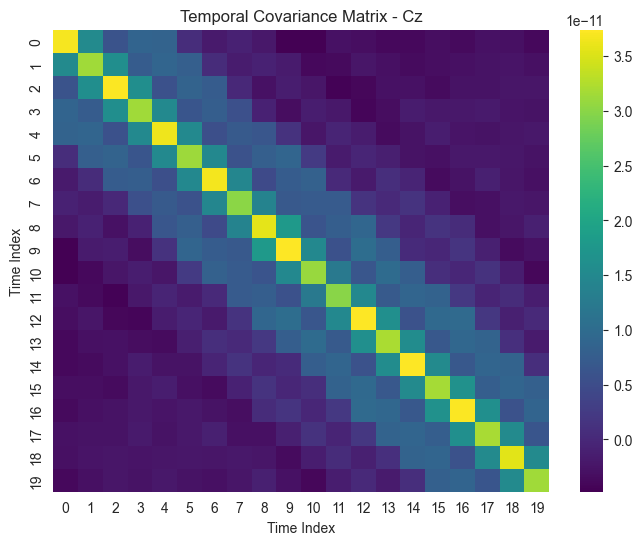

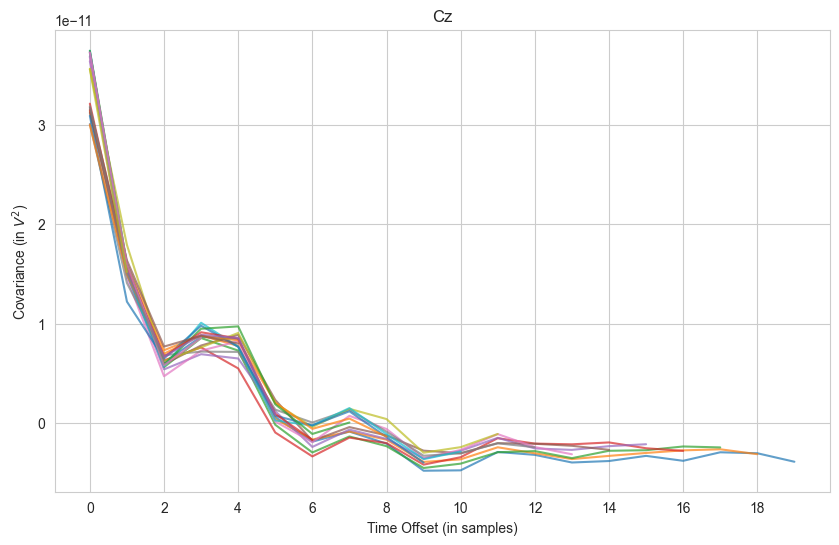

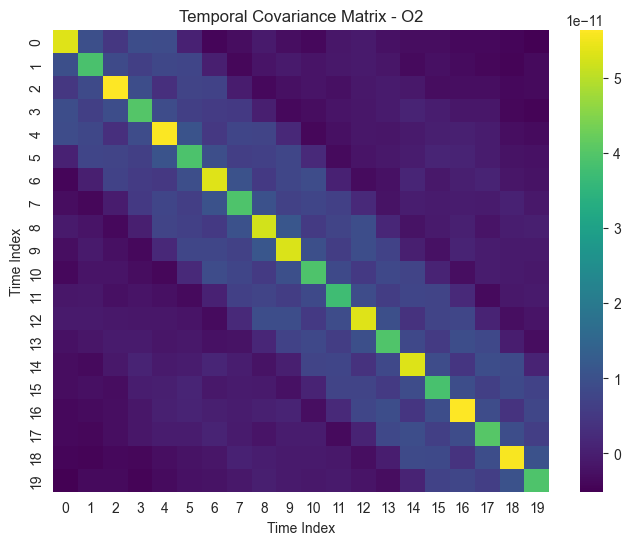

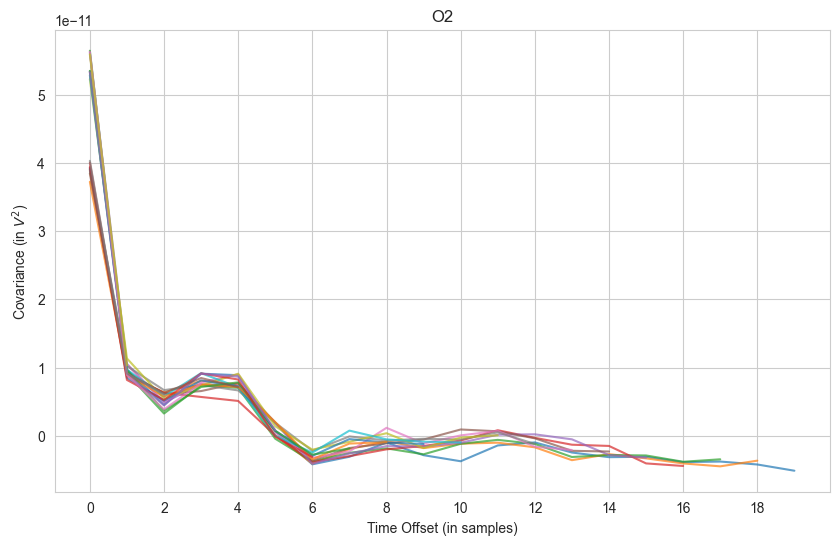

In [ ]:
session = 'P01_S03'
blocks = data[session]
raw = load_and_concatenate_raws(blocks)

# Load ICA object
ica_path = os.path.join(ica_dir, f"{session}-ica.fif")
ica = mne.preprocessing.read_ica(ica_path)

# Get artifact components from dataframe
artifact_ics = df_ics.loc[df_ics['session'] == session, 'artifact_ics'].values[0]

mod_raw = apply_ica_and_exclude_sources(raw, ica, artifact_ics)
temporal_covs = check_BT_assumptions(mod_raw, channel_names=['F3', 'Cz', 'O2'], t_min=0.1, t_max=0.6, h_pass=0.5, l_pass=40)

# Clean up variables
del session, blocks, raw, artifact_ics, mod_raw, temporal_covs

### Helper functions for applying ICA, training and testing

In [ ]:
# stay in ICA space
def apply_ica_and_modify_sources(raw, ica, component_idxs, scaling_factor):
    source_raw = ica.get_sources(raw)
    modified_source_raw = source_raw.copy()
    for idx in component_idxs:
        modified_source_raw._data[idx] *= scaling_factor

    return modified_source_raw


def extract_features_and_labels(raw, tmin, tmax, clf_ival_boundaries):
    target_ids = list(range(111, 117))
    non_target_ids = list(range(101, 107))

    event_id = {f"Word_{i-110}/Target": i for i in target_ids}
    event_id.update({f"Word_{i-100}/NonTarget": i for i in non_target_ids})

    epochs = mne.Epochs(raw, event_id=event_id, tmin=tmin, tmax=tmax, decim=1,
                        baseline=None, preload=True, event_repeated='drop')

    y = epochs.events[:, 2]
    y_bin = np.array([1 if label in target_ids else 0 for label in y])

    X_features = get_jumping_means(epochs, clf_ival_boundaries)
    X_features = X_features.transpose(0, 2, 1).reshape(X_features.shape[0], -1)

    return X_features, y_bin



def run_classification(X, y, classifiers, train_sizes, n_test, session_name, scaling_factor):
    lda_weights_list = []
    results = []
    for clf_name, clf in classifiers.items():
        for train_size in train_sizes:
            if train_size >= len(X):
                continue

            X_train, y_train = X[:train_size], y[:train_size]
            X_test, y_test = X[-n_test:], y[-n_test:]

            pipeline = make_pipeline(StandardScaler(), clf)
            pipeline.fit(X_train, y_train)

            clf_trained = pipeline.named_steps[clf.__class__.__name__.lower()]

            if hasattr(clf_trained, 'coef_'):
                scaling_factors = clf_trained.coef_[0]

                lda_weights_list.append({
                    'session': session_name,
                    'classifier': clf_name,
                    'train_size': train_size,
                    'scaling_factor': scaling_factor,
                    **{f'w{i}': w for i, w in enumerate(scaling_factors)}
                })


            y_proba = pipeline.predict_proba(X_test)[:, 1]
            auc = roc_auc_score(y_test, y_proba)

            results.append({
                'session': session_name,
                'scaling_factor': scaling_factor,
                'classifier': clf_name,
                'train_size': train_size,
                'AUC': auc
            })

    return results, pd.DataFrame(lda_weights_list)




def run_ica_weight_experiment(data, df_ics, ica_dir, output_dir,
                               scaling_factors, classifiers, train_sizes, clf_ival_boundaries,
                               n_test, tmin=0.1, tmax=0.8):

    os.makedirs(ica_dir, exist_ok=True)
    os.makedirs(output_dir, exist_ok=True)

    results_all = []
    weights_all = []

    for session_name, blocks in data.items():
        print(f"\nSession: {session_name}")
        blink_idxs = df_ics.loc[df_ics['session'] == session_name, 'artifact_ics'].values
        blink_idxs = blink_idxs[0]
        
        ica_path = os.path.join(ica_dir, f"{session_name}-ica.fif")
        ica = mne.preprocessing.read_ica(ica_path)

        raw_full = load_and_concatenate_raws(blocks)        # all runs of a session
        raw_copy = raw_full.copy()

        for scaling_factor in scaling_factors:
            print(f"  Scaling factor: {scaling_factor}")
            modified_raw = apply_ica_and_modify_sources(raw_copy, ica, blink_idxs, scaling_factor)
            
            # print original and modified ICA component variances to check if scaling factors were properly applied
            original_sources = ica.get_sources(raw_copy)
            modified_sources = modified_raw

            for idx in blink_idxs:
                var_orig = np.var(original_sources._data[idx])
                var_mod = np.var(modified_sources._data[idx])
                ratio = var_mod / var_orig if var_orig != 0 else float('inf')
                print(f"    IC {idx}: var_orig={var_orig:.4e}, var_mod={var_mod:.4e}, ratio={ratio:.2f}")
    
            X, y = extract_features_and_labels(modified_raw, tmin, tmax, clf_ival_boundaries)       # epochs are made in 'extract_features_and_labels()'

            results, weights_df = run_classification(X, y, classifiers, train_sizes, n_test, session_name, scaling_factor)
            results_all.extend(results)
            weights_all.append(weights_df)

    
    df_results = pd.DataFrame(results_all)
    # Save results to external SSD
    patient_id = next(iter(data))[:3]  
    
    results_path = os.path.join(output_dir, f'ica_weight_experiment_{patient_id}_results.csv')
    df_results.to_csv(results_path, index=False)
    print(f"Results saved to: {results_path}")
    
    df_weights = pd.concat(weights_all, ignore_index=True)
    weights_path = os.path.join(output_dir, f'ica_weight_experiment_{patient_id}_weights.csv')
    df_weights.to_csv(weights_path, index=False)
    print(f"LDA Weights saved to: {weights_path}")

    return df_results


        

### Running the experiment

In [ ]:
# running the experiment
df_results = run_ica_weight_experiment(
    data=data,
    df_ics=df_ics,
    ica_dir='/Volumes/Lexar/ica_outputs',
    output_dir='/Volumes/Lexar/amplified_outputs',
    scaling_factors=[0, 0.0001, 0.5, 1, 1.5, 2, 15],
    classifiers={
        'LDA': LDA(),
        'Shrinkage LDA': LDA(solver='lsqr', shrinkage='auto'),
        'ToeplitzLDA': ToeplitzLDA(n_channels=20)
    },
    train_sizes=[60, 120, 180, 240, 300, 390],
    clf_ival_boundaries=np.array([0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8]),
    n_test=000
)



Session: P01_S03
  Scaling factor: 0
    IC 0: var_orig=9.9015e-01, var_mod=0.0000e+00, ratio=0.00
    IC 6: var_orig=1.1243e+00, var_mod=0.0000e+00, ratio=0.00
  Scaling factor: 0.0001
    IC 0: var_orig=9.9015e-01, var_mod=9.9015e-09, ratio=0.00
    IC 6: var_orig=1.1243e+00, var_mod=1.1243e-08, ratio=0.00
  Scaling factor: 0.5
    IC 0: var_orig=9.9015e-01, var_mod=2.4754e-01, ratio=0.25
    IC 6: var_orig=1.1243e+00, var_mod=2.8107e-01, ratio=0.25
  Scaling factor: 1
    IC 0: var_orig=9.9015e-01, var_mod=9.9015e-01, ratio=1.00
    IC 6: var_orig=1.1243e+00, var_mod=1.1243e+00, ratio=1.00
  Scaling factor: 1.5
    IC 0: var_orig=9.9015e-01, var_mod=2.2278e+00, ratio=2.25
    IC 6: var_orig=1.1243e+00, var_mod=2.5296e+00, ratio=2.25
  Scaling factor: 2
    IC 0: var_orig=9.9015e-01, var_mod=3.9606e+00, ratio=4.00
    IC 6: var_orig=1.1243e+00, var_mod=4.4971e+00, ratio=4.00
  Scaling factor: 15
    IC 0: var_orig=9.9015e-01, var_mod=2.2278e+02, ratio=225.00
    IC 6: var_orig=1.124

### Plotting distribution of LDA weight values (histograms)

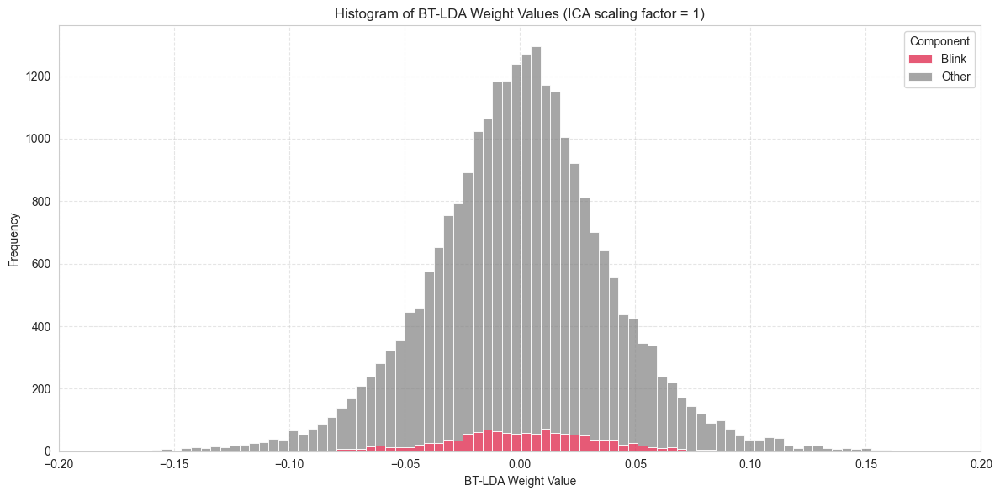

In [ ]:

blink_ic_map = {
    'P01_S03': 0,
    'P01_S04': 0,
    'P01_S05': 0,
    'P01_S06': 0,
    'P01_S07': 0,
    'P01_S08': 0,
    'P01_S09': 2,
    'P01_S10': 0,
    'P01_S11': 0,
    'P01_S12': 0,
    'P01_S13': 0,
    'P01_S14': 0,
    'P01_S15': 0,
    'P01_S16': 0,
    'P01_S17': 0,
}

n_components = 20

# Load dataframe
df_weights = pd.read_csv('/Volumes/Lexar/amplified_outputs/ica_weight_experiment_P01_weights.csv')

# Filter to relevant rows
df_filtered = df_weights[(df_weights['scaling_factor'] == 15) & (df_weights['classifier'] == 'ToeplitzLDA')]

# Keep only sessions in blink_ic_map
df_filtered = df_filtered[df_filtered['session'].isin(blink_ic_map.keys())]

# Melt to long format
lda_weight_cols = [f'w{i}' for i in range(280)]
df_melted = df_filtered[['session'] + lda_weight_cols].melt(
    id_vars='session',
    var_name='weight_index',
    value_name='weight_value'
)

df_melted['index'] = df_melted['weight_index'].str.extract(r'(\d+)').astype(int)

# Get blink_ic per row using the map
df_melted['blink_ic'] = df_melted['session'].map(blink_ic_map)

# Calculate blink indices for each session
df_melted['is_blink_component'] = df_melted.apply(
    lambda row: row['index'] in [i * n_components + row['blink_ic'] for i in range(14)],
    axis=1
)

# Plot
plt.figure(figsize=(12, 6))
sns.histplot(
    data=df_melted,
    x='weight_value',
    hue='is_blink_component',
    bins=100,
    palette={True: 'crimson', False: 'grey'},
    alpha=0.7,
    multiple='stack'
)

plt.title('Histogram of BT-LDA Weight Values (ICA scaling factor = 1)')
plt.xlabel('BT-LDA Weight Value')
plt.ylabel('Frequency')
plt.legend(title='Component', labels=['Blink', 'Other'])
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlim(-0.2, 0.2)
plt.tight_layout()
plt.show()


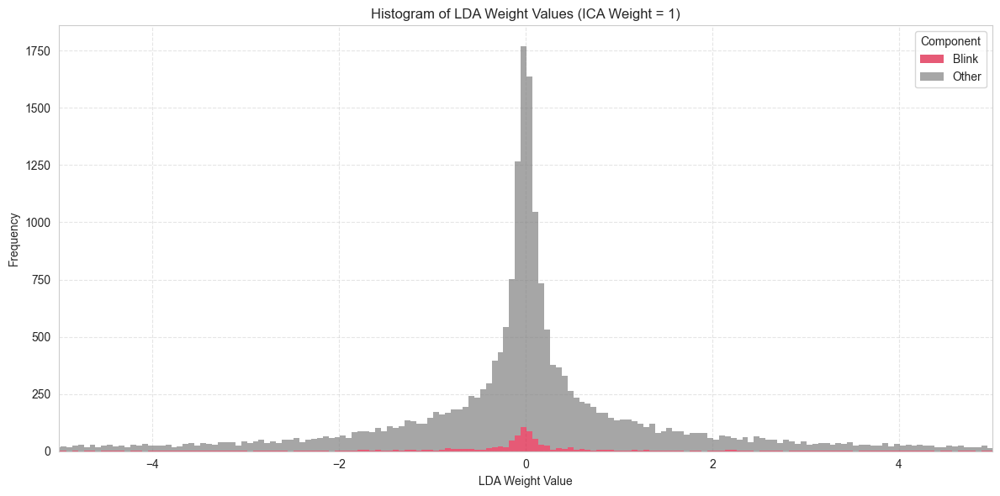

In [ ]:


# Load dataframe
df_weights = pd.read_csv('/Volumes/Lexar/amplified_outputs/ica_weight_experiment_P01weights.csv')

# Filters to relevant rows
df_filtered = df_weights[(df_weights['scaling_factor'] == 1) & (df_weights['classifier'] == 'LDA')]

# Keep only sessions in blink_ic_map
df_filtered = df_filtered[df_filtered['session'].isin(blink_ic_map.keys())]

# Melt to long format
lda_weight_cols = [f'w{i}' for i in range(280)]
df_melted = df_filtered[['session'] + lda_weight_cols].melt(
    id_vars='session',
    var_name='weight_index',
    value_name='weight_value'
)

df_melted['index'] = df_melted['weight_index'].str.extract(r'(\d+)').astype(int)

# Get blink_ic per row using the map
df_melted['blink_ic'] = df_melted['session'].map(blink_ic_map)

# Calculate blink indices for each session
df_melted['is_blink_component'] = df_melted.apply(
    lambda row: row['index'] in [i * n_components + row['blink_ic'] for i in range(14)],
    axis=1
)

# Plot
plt.figure(figsize=(12, 6))
sns.histplot(
    data=df_melted,
    x='weight_value',
    hue='is_blink_component',
    bins=8000,
    palette={True: 'crimson', False: 'grey'},
    alpha=0.7,
    multiple='stack'
)

plt.title('Histogram of LDA Weight Values (ICA Weight = 1)')
plt.xlabel('LDA Weight Value')
plt.ylabel('Frequency')
plt.legend(title='Component', labels=['Blink', 'Other'])
plt.grid(True, linestyle='--', alpha=0.5)
plt.xlim(-5, 5)
plt.tight_layout()
plt.show()



### Plot AUC results

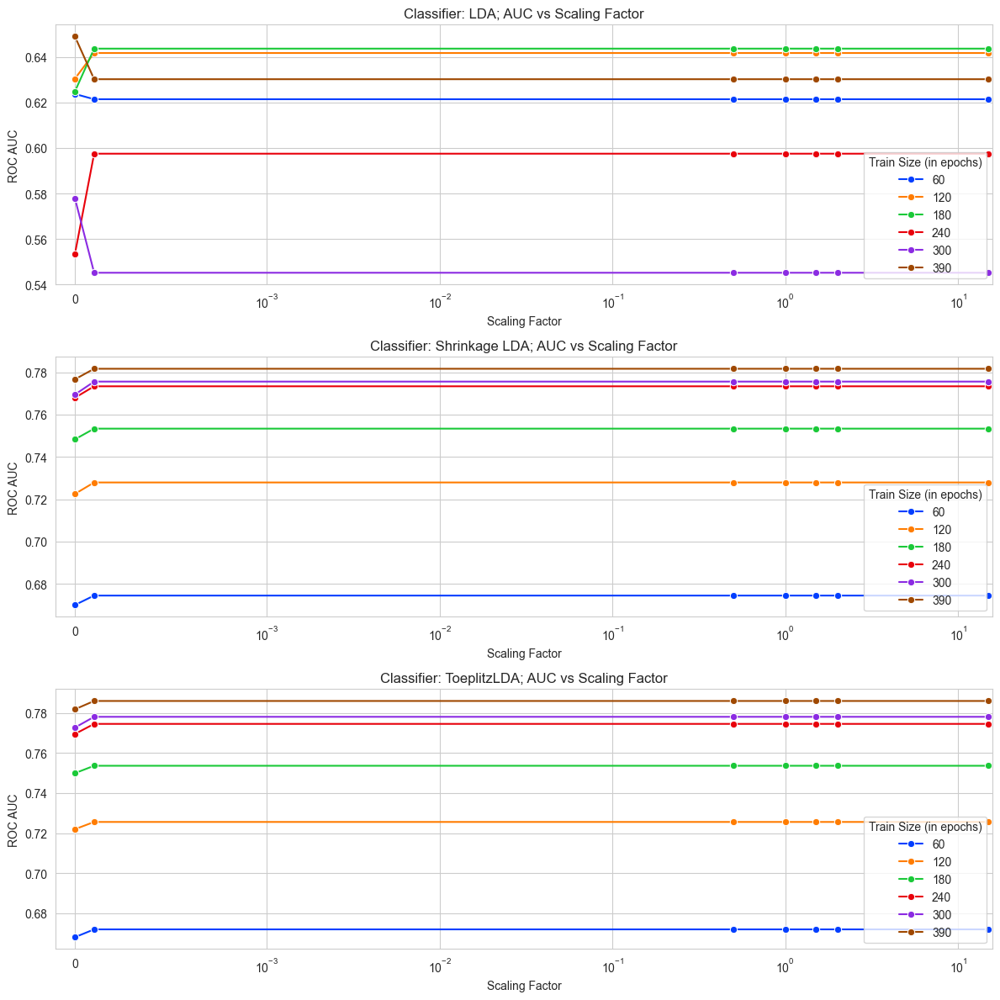

In [ ]:
def plot_auc_results(df):
    classifiers = df['classifier'].unique()
    plt.figure(figsize=(12, 4 * len(classifiers)))  # Adjust height per classifier

    for i, clf_name in enumerate(classifiers, 1):
        plt.subplot(len(classifiers), 1, i)
        subset = df[df['classifier'] == clf_name]
        sns.lineplot(
            data=subset,
            x='scaling_factor', y='AUC',
            hue='train_size', palette='bright',
            marker='o', dashes=False, ci=None
        )
        plt.title(f'Classifier: {clf_name}; AUC vs Scaling Factor')
        plt.xlabel('Scaling Factor')
        plt.ylabel('ROC AUC')
        plt.legend(title='Train Size (in epochs)')
        plt.grid(True)
        plt.xscale('symlog', linthresh=1e-3)
        plt.xlim(-0.0001,15.8)

    plt.tight_layout()
    plt.show()



df_P1 = pd.read_csv('/Volumes/Lexar/amplified_outputs/ica_weight_experiment_P01results.csv')
plot_auc_results(df_P1)

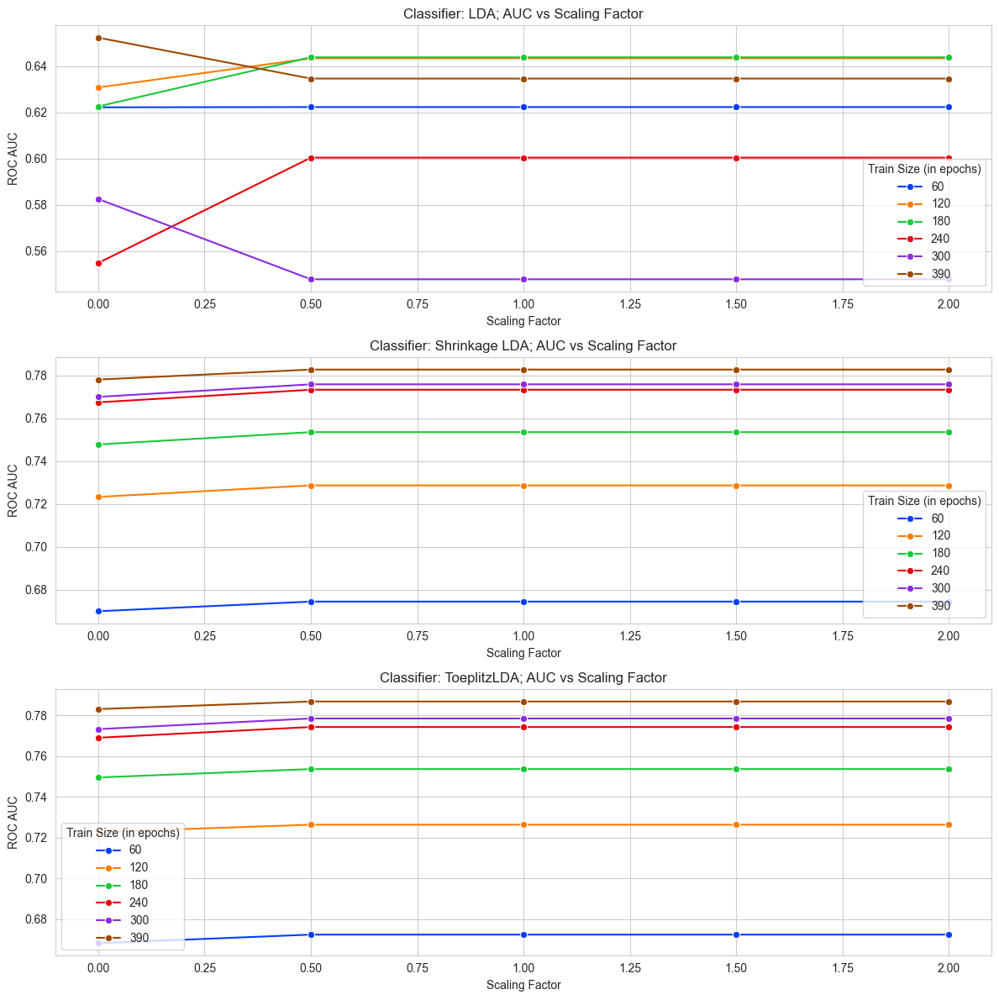

In [ ]:
def plot_auc_results(df):
    classifiers = df['classifier'].unique()
    plt.figure(figsize=(12, 4 * len(classifiers)))  # Adjust figure height based on number of classifiers

    for i, clf_name in enumerate(classifiers, 1):
        plt.subplot(len(classifiers), 1, i)
        subset = df[(df['classifier'] == clf_name )& (~df['scaling_factor'].isin([0.0001, 15]))]    # do not plot scaling factors 0.0001 and 15
        sns.lineplot(
            data=subset,
            x='scaling_factor', y='AUC',
            hue='train_size', palette='bright',
            marker='o', dashes=False, ci=None
        )
        plt.title(f'Classifier: {clf_name}; AUC vs Scaling Factor')
        plt.xlabel('Scaling Factor')
        plt.ylabel('ROC AUC')
        plt.legend(title='Train Size (in epochs)')
        plt.grid(True)

    plt.tight_layout()
    plt.show()


df_P1 = pd.read_csv('/Volumes/Lexar/amplified_outputs/ica_weight_experiment_P01results.csv')
plot_auc_results(df_P1)

Wilcoxon signed-rank test: stat=10.000, p=0.0026


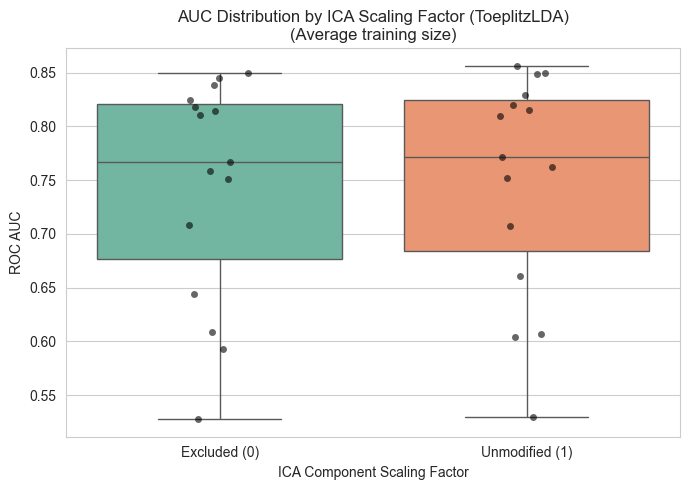

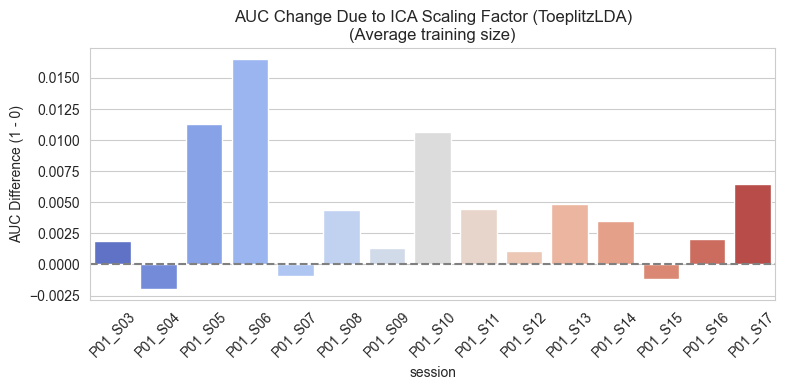

In [ ]:
# Filter for classifier and train sizes between 60 and 240 inclusive
btlda_df = df_results[
    (df_results['classifier'] == 'ToeplitzLDA') &
    (df_results['train_size'] >= 60) &
    (df_results['train_size'] <= 390)]

# Average AUC across these train sizes for each session and scaling factor
mean_auc = btlda_df.groupby(['session', 'scaling_factor'])['AUC'].mean().reset_index()

# Pivot (each session has AUC for weight 0 and 1)
pivot = mean_auc.pivot(index='session', columns='scaling_factor', values='AUC').dropna()

stat, p_val = wilcoxon(pivot[0], pivot[1])
print(f"Wilcoxon signed-rank test: stat={stat:.3f}, p={p_val:.4f}")

melted = pivot.reset_index().melt(id_vars='session', value_vars=[0, 1], var_name='scaling_factor', value_name='AUC')

plt.figure(figsize=(7, 5))
sns.boxplot(data=melted, x='scaling_factor', y='AUC', palette='Set2')
sns.stripplot(data=melted, x='scaling_factor', y='AUC', color='black', alpha=0.6, jitter=True)
plt.title('AUC Distribution by ICA Scaling Factor (ToeplitzLDA)\n(Average training size)')
plt.xticks([0, 1], labels=['Excluded (0)', 'Unmodified (1)'])
plt.xlabel('ICA Component Scaling Factor')
plt.ylabel('ROC AUC')
plt.tight_layout()
plt.show()

# Bar plot 
pivot['diff'] = pivot[1] - pivot[0]
plt.figure(figsize=(8, 4))
sns.barplot(x='session', y='diff', data=pivot, palette='coolwarm')
plt.axhline(0, linestyle='--', color='gray')
plt.ylabel('AUC Difference (1 - 0)')
plt.title('AUC Change Due to ICA Scaling Factor (ToeplitzLDA)\n(Average training size)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()




### Run Wilcoxon signed-rank test

Wilcoxon test (per patient avg): stat=20.000, p=0.4922


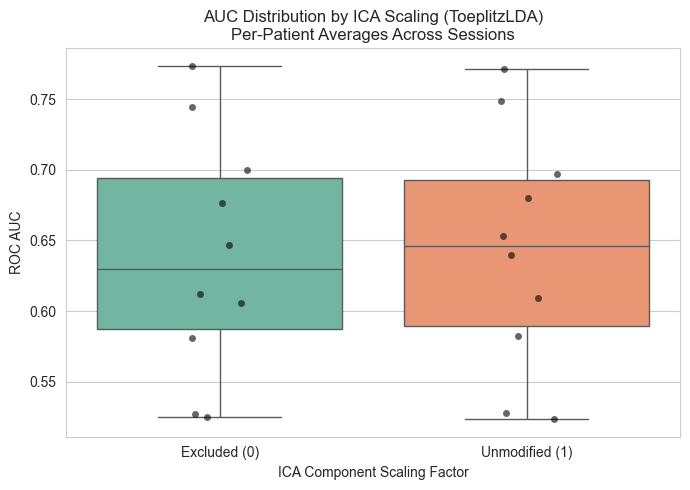

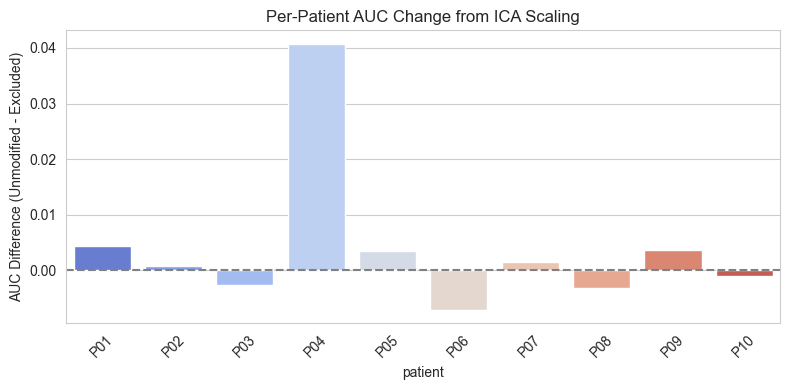

In [ ]:
# Get all result files
result_files = glob.glob('/Volumes/Lexar/amplified_outputs/ica_weight_experiment_P*results.csv')

# Load and concatenate with correct patient ID (extraction from filename)
df_list = []
for f in result_files:
    df = pd.read_csv(f)
    
    basename = os.path.basename(f)
    match = re.search(r'_P(\d+)', basename)
    if match:
        patient_num = int(match.group(1))
        patient_id = f'P{patient_num:02d}'
    else:
        raise ValueError(f"Could not get patient ID from filename {basename}")
    
    df['patient'] = patient_id
    df_list.append(df)  

df_all = pd.concat(df_list, ignore_index=True)

# Filter for ToeplitzLDA classifier, selected train sizes and scaling factors
filtered = df_all[
    (df_all['classifier'] == 'ToeplitzLDA') &
    (df_all['train_size'] >= 60) &
    (df_all['train_size'] <= 390) &
    (df_all['scaling_factor'].isin([0, 1]))
]

# Compute mean AUC per patient and scaling factor
mean_auc_by_patient = filtered.groupby(['patient', 'scaling_factor'])['AUC'].mean().reset_index()

pivot = mean_auc_by_patient.pivot(index='patient', columns='scaling_factor', values='AUC').dropna()

# Wilcoxon test between scaling 0 and 1
stat, p_val = wilcoxon(pivot[0], pivot[1])
print(f"Wilcoxon test (per patient avg): stat={stat:.3f}, p={p_val:.4f}")

# Melt for plotting
melted = pivot.reset_index().melt(id_vars='patient', var_name='scaling_factor', value_name='AUC')

# Boxplot + stripplot
plt.figure(figsize=(7, 5))
sns.boxplot(data=melted, x='scaling_factor', y='AUC', palette='Set2')
sns.stripplot(data=melted, x='scaling_factor', y='AUC', color='black', alpha=0.6, jitter=True)
plt.title('AUC Distribution by ICA Scaling (ToeplitzLDA)\nPer-Patient Averages Across Sessions')
plt.xticks([0, 1], ['Excluded (0)', 'Unmodified (1)'])
plt.xlabel('ICA Component Scaling Factor')
plt.ylabel('ROC AUC')
plt.tight_layout()
plt.show()

# Barplot of difference
pivot['diff'] = pivot[1] - pivot[0]
plt.figure(figsize=(8, 4))
sns.barplot(x=pivot.index, y='diff', data=pivot.reset_index(), palette='coolwarm')
plt.axhline(0, linestyle='--', color='gray')
plt.ylabel('AUC Difference (Unmodified - Excluded)')
plt.title('Per-Patient AUC Change from ICA Scaling')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Baseline case (no ICA)

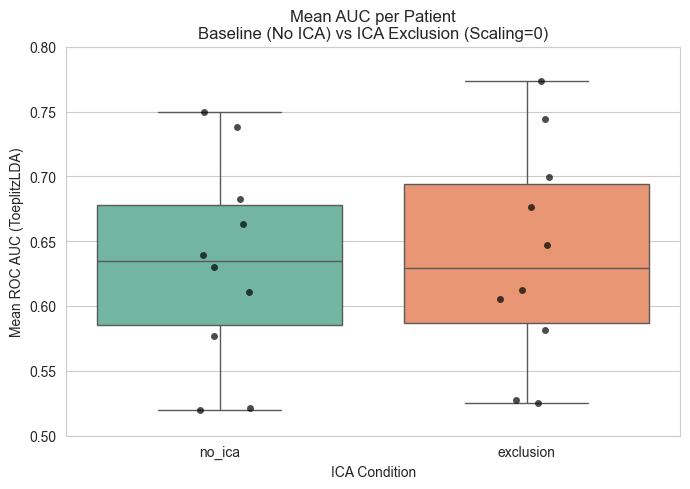

ica_condition  exclusion    no_ica
patient                           
P01             0.744010  0.738005
P02             0.527073  0.521161
P03             0.773651  0.749598
P04             0.612078  0.663015
P05             0.676694  0.682685
P06             0.646897  0.639715
P07             0.581199  0.576858
P08             0.699865  0.629811
P09             0.605434  0.611093
P10             0.524767  0.519540
Wilcoxon signed-rank test: statistic=17.000, p-value=0.3223


In [ ]:
# Load files (no ICA)
baseline_files = glob.glob('/Volumes/Lexar/amplified_outputs/no_ica_experiment_P*results.csv')

baseline_list = []
for f in baseline_files:
    df = pd.read_csv(f)

    df['patient'] = df['session'].str.split('_').str[0]
    baseline_list.append(df)

df_baseline = pd.concat(baseline_list, ignore_index=True)

# Filter baseline for ToeplitzLDA and train_size 60-390
baseline_filtered = df_baseline[
    (df_baseline['classifier'] == 'ToeplitzLDA') &
    (df_baseline['train_size'] >= 60) &
    (df_baseline['train_size'] <= 390)
]

mean_baseline = baseline_filtered.groupby('patient', as_index=False)['AUC'].mean()
mean_baseline['ica_condition'] = 'no_ica'


# Load files (ICA with scaling factor 1)
ica_files = glob.glob('/Volumes/Lexar/amplified_outputs/ica_weight_experiment_P*results.csv')

ica_list = []
for f in ica_files:
    df = pd.read_csv(f)
    df['patient'] = df['session'].str.split('_').str[0]
    ica_list.append(df)

df_ica = pd.concat(ica_list, ignore_index=True)


ica_exclusion_filtered = df_ica[
    (df_ica['classifier'] == 'ToeplitzLDA') &
    (df_ica['train_size'] >= 60) &
    (df_ica['train_size'] <= 390) &
    (df_ica['scaling_factor'] == 0)
]

# Mean AUC per patient (ICA exclusion)
mean_exclusion = ica_exclusion_filtered.groupby('patient', as_index=False)['AUC'].mean()
mean_exclusion['ica_condition'] = 'exclusion'

combined = pd.concat([mean_baseline, mean_exclusion], ignore_index=True)

# Plot
plt.figure(figsize=(7, 5))
sns.boxplot(data=combined, x='ica_condition', y='AUC', palette='Set2')
sns.stripplot(data=combined, x='ica_condition', y='AUC', color='black', alpha=0.7, jitter=True)

plt.title('Mean AUC per Patient\nBaseline (No ICA) vs ICA Exclusion (Scaling=0)')
plt.xlabel('ICA Condition')
plt.ylabel('Mean ROC AUC (ToeplitzLDA)')
plt.ylim(0.5, 0.8)
plt.tight_layout()
plt.show()

# Pivot combined data for Wilcoxon test
pivot = combined.pivot(index='patient', columns='ica_condition', values='AUC')
print(pivot)

# Wilcoxon signed-rank test between 'no_ica' and 'exclusion'
stat, p_val = wilcoxon(pivot['no_ica'], pivot['exclusion'])

print(f"Wilcoxon signed-rank test: statistic={stat:.3f}, p-value={p_val:.4f}")